# Part 2 — Sprint Kinematics fPCA

Second notebook in the three-part pipeline.

| Part | Notebook | Purpose |
|------|----------|---------|
| 1 | Sprint_Ensemble_Viz.ipynb | Skeleton viewer (load + GCS-align + draw) |
| **2** | **Kinematics_PCA.ipynb** | **C3D processing → stride vectors → fPCA** |
| 3 | Sprint_ML_Analysis.ipynb | Machine learning |

This notebook is **self-contained**: it re-reads the C3D files, applies stride
detection and biomechanics metrics, builds the 19 392-element stride vectors,
then runs fPCA. It does **not** depend on Part 1.


Imports OK
Imports OK  (incl. scipy.signal.find_peaks)
Found 31 C3D files
Figures → /Users/shunchen/Desktop/60m Project Folder/Shun's Sprints Code/Outputs/Figures
Sex data for 31 participants (16M / 15F)
load_c3d_raw defined.
Drawing helpers defined.
[31/31] SB92-001


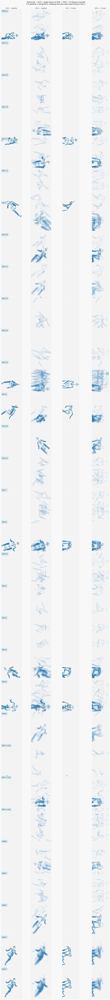

Saved : QA_skeleton_grid.png
Loaded: 31/31   |   Failed: 0
pca_align (Chris V. horizontal-plane only) + segment_sprint + compute_thoracic_velocity + find_max_velocity_phase + level_ground (no-op) + prepare_aligned defined.
[31/31] SB92  01  
All velocity checks passed.
Auto limits — sag H: (-1009, 934), frt H: (-676, 575), vert: (-174, 1959)


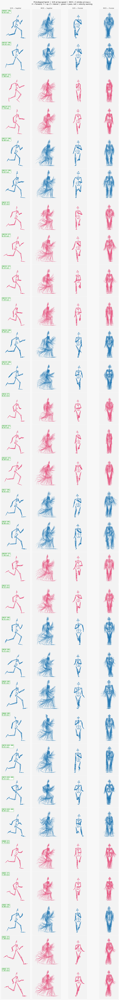

Saved : QA_skeleton_grid_top_speed.png
Aligned: 31/31   |   Failed: 0


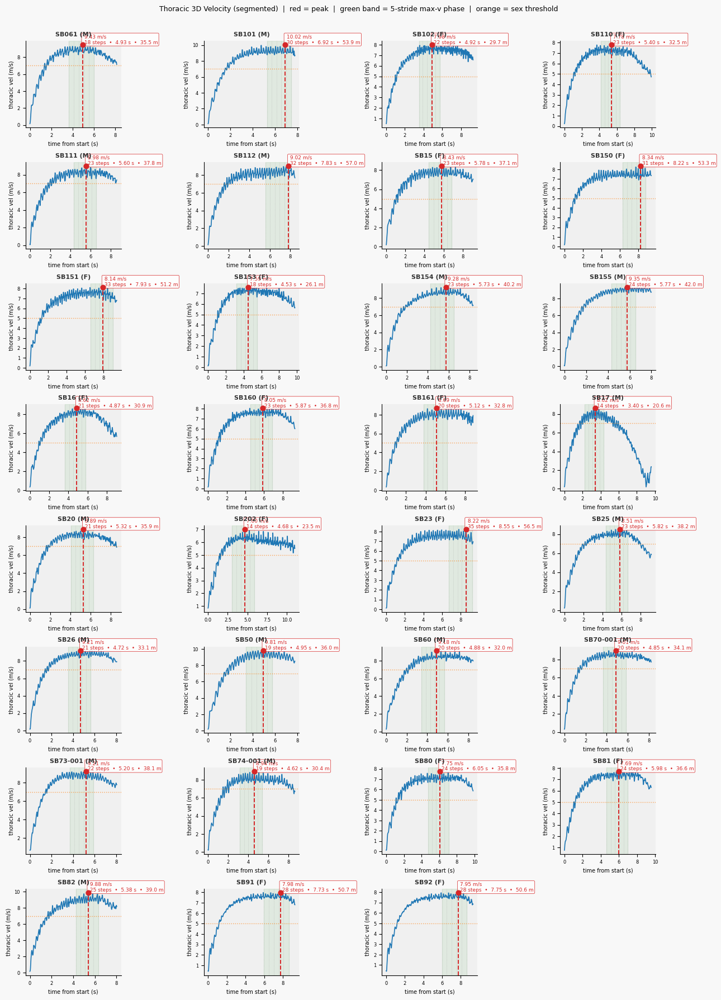

Saved : velocity_profiles_top_speed.png

Canonical pca_align loaded from (FINAL) Sprint_Ensemble_Viz.ipynb


In [1]:
# ── Imports ───────────────────────────────────────────────────────────────────
# These lines load "libraries" — pre-written code toolkits you install once
# and then borrow.  Think of them like apps you install before using.

import numpy as np          # numpy  : fast maths on large arrays of numbers
import pandas as pd         # pandas : spreadsheet-like tables (DataFrames)
from pathlib import Path    # Path   : build file/folder paths safely on any OS
from tqdm.auto import tqdm  # tqdm   : draws a progress bar inside for-loops
import matplotlib.pyplot as plt     # pyplot  : draw charts and graphs
import matplotlib.colors as mcolors # mcolors : colour utilities for charts
import pickle, warnings     # pickle : save Python objects to disk; warnings : silence noisy messages

# scikit-learn — the main machine-learning library
from sklearn.decomposition import PCA            # PCA : finds main "directions" of variation
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import LeaveOneOut, cross_val_predict
from sklearn.metrics import r2_score

from scipy.signal import find_peaks   # find local peaks / troughs in a signal
from scipy.stats import pearsonr      # Pearson r (correlation between two arrays)
import statsmodels.api as sm          # detailed statistical regression

import ezc3d          # reads .c3d motion-capture files   (pip install ezc3d)
import pyvista as pv  # 3-D interactive visualisation     (pip install pyvista)

warnings.filterwarnings('ignore')   # hide harmless warning messages
np.random.seed(42)                  # fix random number seed → reproducible results
print("Imports OK")


# ── Pull canonical alignment from (FINAL) Sprint_Ensemble_Viz.ipynb ───────────
# This is Part 1 of the pipeline. We %run it to import its alignment function
# (pca_align) so Kinematics_PCA uses *exactly* the same Chris-V.-style
# alignment that produced the validated 31/31 skeleton grid.
import os as _os
_os.chdir("/Users/shunchen/Desktop/60m Project Folder/Shun's Sprints Code")
get_ipython().run_line_magic("run", '"(FINAL) Sprint_Ensemble_Viz.ipynb"')
print("\nCanonical pca_align loaded from (FINAL) Sprint_Ensemble_Viz.ipynb")


In [2]:
# ── Paths ─────────────────────────────────────────────────────────────────────
# Path() turns a text string into a proper file path that works on any OS.
# The / operator joins folders together (like writing "folder/subfolder").
C3D_DIR    = Path("/Users/shunchen/Desktop/60m Project Folder/31 Trials Data Folder/C3D, XLSX/Sprint Trials in c3d")
SCRIPT_DIR = Path("/Users/shunchen/Desktop/60m Project Folder/Shun's Sprints Code")
DATA_DIR   = SCRIPT_DIR / "Outputs" / "Data"     # where we save .npy / .csv files
FIG_DIR    = SCRIPT_DIR / "Outputs" / "Figures"  # where we save charts
DATA_DIR.mkdir(parents=True, exist_ok=True)   # create the folder if it doesn't exist yet
FIG_DIR.mkdir(parents=True, exist_ok=True)

# ── Constants ─────────────────────────────────────────────────────────────────
# Fixed settings that never change during a run.
# UPPER_CASE is a Python convention meaning "treat this as read-only".
RANDOM_SEED          = 42       # any fixed number ensures reproducible random results
SAMPLING_RATE        = 60       # the motion-capture camera records 60 frames per second
TN_POINTS            = 101      # every stride is stretched / compressed to exactly 101 frames
N_MARKERS_C3D        = 64       # 64 reflective dots placed on the body
N_SEGMENTS           = 23       # 23 body segments (pelvis, spine sections, arms, legs, ...)
N_STRIDES_TARGET     = 5        # use the 5 strides nearest to top speed
TRIM_DISTANCE_M      = 62.0     # only keep data for the first 62 m (track length)
STRIDE_MIN_DISTANCE  = 30       # a new stride must start >= 30 frames after the last
STRIDE_PROMINENCE_M  = 0.02     # a foot contact must dip >= 2 cm below its neighbours
SPRINT_START_VEL_THRESH = 1.0   # start timing when pelvis moves forward faster than 1 m/s
SPRINT_START_SUSTAIN = 5        # velocity must stay above that for 5 consecutive frames
EXCLUDED_PIDS        = ['SB17'] # SB17 excluded: T8 marker lost tracking in their trial

# ── Participant sex lookup ─────────────────────────────────────────────────────
# A dictionary is a lookup table: key -> value.
# e.g.  PARTICIPANT_SEX['SB15']  returns  'F'
PARTICIPANT_SEX = {
    'SB15': 'F', 'SB16': 'F', 'SB17': 'M', 'SB20': 'M', 'SB23': 'F',
    'SB25': 'M', 'SB26': 'M', 'SB50': 'M', 'SB60': 'M',
    'SB061': 'M', 'SB70': 'M', 'SB73': 'M', 'SB74': 'M',
    'SB80': 'F', 'SB81': 'F', 'SB82': 'M', 'SB91': 'F', 'SB92': 'F',
    'SB101': 'M', 'SB102': 'F', 'SB110': 'F', 'SB111': 'M', 'SB112': 'M',
    'SB150': 'F', 'SB151': 'F', 'SB153': 'F', 'SB154': 'M', 'SB155': 'M',
    'SB160': 'F', 'SB161': 'F', 'SB202': 'F',
}

# ── 23-segment indices (0-based) ──────────────────────────────────────────────
# Python counts from 0.  IDX_PELVIS = 0 means "the first entry is the pelvis".
IDX_PELVIS   = 0;  IDX_L5 = 1;  IDX_L3 = 2;  IDX_T12 = 3;  IDX_T8 = 4
IDX_NECK     = 5;  IDX_HEAD = 6
IDX_R_FOOT   = 17; IDX_R_TOE = 18; IDX_L_FOOT = 21; IDX_L_TOE = 22
THORAX_IDX   = [1, 2, 3, 4, 5, 7, 11]   # spine + shoulder segment indices (23-seg)
THORAX_MKS_64 = [10, 11, 12, 13, 14, 20, 21]  # raw 64-marker thorax indices (Sprint Viz)

# List of segment names in order (position in list matches the index above)
SEGMENTS = [
    'Pelvis', 'L5', 'L3', 'T12', 'T8', 'Neck', 'Head',
    'Right Shoulder', 'Right Upper Arm', 'Right Forearm', 'Right Hand',
    'Left Shoulder', 'Left Upper Arm', 'Left Forearm', 'Left Hand',
    'Right Upper Leg', 'Right Lower Leg', 'Right Foot', 'Right Toe',
    'Left Upper Leg', 'Left Lower Leg', 'Left Foot', 'Left Toe',
]

# ── 64-marker constants (0-based Python indices) ──────────────────────────────
MK_PELVIS     = 0;   MK_T12 = 10
MK_R_HEEL     = 52;  MK_L_HEEL = 58
MK_R_TOE      = 57;  MK_L_TOE  = 63
MK_HEAD       = [16, 17, 18, 19]    # four head markers — averaged for head position
MK_PELVIS_ALL = [0, 1, 2, 3, 4, 5, 6]
MK_R_KNEE     = [39, 40]; MK_L_KNEE  = [43, 44]
MK_R_ANKLE    = [47, 48]; MK_L_ANKLE = [50, 51]

# Multiply raw coordinates (metres) by 1000 to get millimetres (matches MATLAB)
SCALE_MM = 1000.0

# ── Segment mapping: C3D marker name -> body segment centroid ─────────────────
# Tells us which marker labels to combine to represent each body segment.
# A tuple ('A', 'B') means "average marker A and marker B".
# A nested tuple means "first average the inner pair, then average the result".
C3D_TO_XSENS_SEGMENT_MAP = {
    'Pelvis':          'pHipOrigin',
    'L5':              ('pHipOrigin',      'pL5SpinalProcess'),
    'L3':              ('pL5SpinalProcess','pL3SpinalProcess'),
    'T12':             ('pL3SpinalProcess','pT12SpinalProcess'),
    'T8':              ('pT12SpinalProcess','pT8SpinalProcess'),
    'Neck':            ('pT4SpinalProcess','pC7SpinalProcess'),
    'Head':            ('pRightAuricularis','pLeftAuricularis'),
    'Right Shoulder':  ('pIJ', 'pRightAcromion'),
    'Right Upper Arm': ('pRightAcromion', ('pRightArmLateralEpicondyle','pRightArmMedialEpicondyle')),
    'Right Forearm':   (('pRightArmLateralEpicondyle','pRightArmMedialEpicondyle'), ('pRightWristLateral','pRightWristMedial')),
    'Right Hand':      ('pRightWristLateral', 'pRightWristMedial'),
    'Left Shoulder':   ('pIJ', 'pLeftAcromion'),
    'Left Upper Arm':  ('pLeftAcromion', ('pLeftArmLateralEpicondyle','pLeftArmMedialEpicondyle')),
    'Left Forearm':    (('pLeftArmLateralEpicondyle','pLeftArmMedialEpicondyle'), ('pLeftWristLateral','pLeftWristMedial')),
    'Left Hand':       ('pLeftWristLateral', 'pLeftWristMedial'),
    'Right Upper Leg': ('pRightGreaterTrochanter', ('pRightKneeLatEpicondyle','pRightKneeMedEpicondyle')),
    'Right Lower Leg': (('pRightKneeLatEpicondyle','pRightKneeMedEpicondyle'), ('pRightLatMalleolus','pRightMedMalleolus')),
    'Right Foot':      ('pRightLatMalleolus', 'pRightHeelFoot'),
    'Right Toe':       ('pRightHeelFoot', 'pRightToe'),
    'Left Upper Leg':  ('pLeftGreaterTrochanter', ('pLeftKneeLatEpicondyle','pLeftKneeMedEpicondyle')),
    'Left Lower Leg':  (('pLeftKneeLatEpicondyle','pLeftKneeMedEpicondyle'), ('pLeftLatMalleolus','pLeftMedMalleolus')),
    'Left Foot':       ('pLeftLatMalleolus', 'pLeftHeelFoot'),
    'Left Toe':        ('pLeftHeelFoot', 'pLeftToe'),
}

c3d_files = sorted(C3D_DIR.glob("*.c3d"))
print(f"C3D dir : {'OK' if C3D_DIR.exists() else 'MISSING'}  ({len(c3d_files)} files)")
print(f"Data out: {DATA_DIR}")


C3D dir : OK  (31 files)
Data out: /Users/shunchen/Desktop/60m Project Folder/Shun's Sprints Code/Outputs/Data


In [3]:
# ── Pipeline helper functions ─────────────────────────────────────────────────
# Each function below does one clearly defined job.
# "def" means "define a new function".  A function is like a recipe: you give
# it ingredients (parameters) and it returns a result.


def _resolve_marker_pos(node, label_to_pos):
    # Look up a marker position by name, or average two positions when given a pair.
    #
    # node         : a string (one marker name) OR a 2-element tuple of nodes
    # label_to_pos : dictionary  {marker_name: 3D_xyz_array}
    # Returns      : (3,) position array, or None if the marker was not found

    # Base case: a single text label — look it up in the dictionary
    if isinstance(node, str):
        return label_to_pos.get(node, None)
    # Recursive case: a pair of nodes — resolve each half and return their midpoint
    if isinstance(node, (list, tuple)) and len(node) == 2:
        a = _resolve_marker_pos(node[0], label_to_pos)
        b = _resolve_marker_pos(node[1], label_to_pos)
        if a is not None and b is not None:
            return (a + b) / 2.0   # midpoint between two 3-D positions
    return None   # could not resolve — return nothing


def c3d_markers_to_segments(raw_markers, labels):
    # Convert 64 raw anatomical markers into 23 body-segment centroids.
    #
    # The C3D file stores 64 reflective dots.  This function groups them into
    # 23 meaningful body parts by averaging the relevant markers for each segment.
    #
    # raw_markers : (n_frames, 64, 3)   [time x marker x xyz]
    # labels      : list of 64 strings, one per marker
    # Returns     : (n_frames, 23, 3)

    # Build a lookup: marker_name -> column_number
    label_to_idx = {lbl: i for i, lbl in enumerate(labels)}
    n_frames = raw_markers.shape[0]
    seg_data = np.zeros((n_frames, N_SEGMENTS, 3))   # output array, starts at zero

    for seg_i, seg_name in enumerate(SEGMENTS):   # loop over every segment
        node = C3D_TO_XSENS_SEGMENT_MAP.get(seg_name)
        if node is None:
            continue   # no mapping defined — leave as zero

        for f in range(n_frames):   # loop over every time frame
            # Build a name->position dictionary just for this single frame
            per_frame = {lbl: raw_markers[f, idx, :] for lbl, idx in label_to_idx.items()}
            pos = _resolve_marker_pos(node, per_frame)
            if pos is not None:
                seg_data[f, seg_i, :] = pos   # store the computed centroid

    return seg_data


def load_c3d(filepath):
    # Load one C3D file and return cleaned marker data.
    #
    # Does three things:
    #   1. Reads the file with ezc3d
    #   2. Fills any missing (NaN) frames by interpolating between neighbours
    #   3. Converts units from mm to metres if needed
    #
    # Returns
    #   marker_data : (n_frames, 23, 3)  metres  — 23 segment centroids
    #   raw_64      : (n_frames, 64, 3)  metres  — all 64 raw markers
    #   fs          : int                Hz      — sampling rate

    c = ezc3d.c3d(str(filepath))
    # C3D stores data as (4, n_markers, n_frames): rows = [x, y, z, confidence]
    points = c['data']['points']
    labels = c['parameters']['POINT']['LABELS']['value']
    fs     = int(c['header']['points']['frame_rate'])

    # Rearrange axes to (n_frames, n_markers, 3) — more intuitive
    raw = points[:3, :, :].transpose(2, 1, 0).copy()

    # Fill gaps: if a marker blinked out (NaN), interpolate from nearby frames
    for mi in range(raw.shape[1]):    # loop over each of the 64 markers
        for ax in range(3):           # loop over x, y, z
            col = raw[:, mi, ax]
            bad = np.isnan(col)       # True where the marker went missing
            if bad.any() and not bad.all():
                good = np.where(~bad)[0]
                col[bad] = np.interp(np.where(bad)[0], good, col[good])

    # Some C3D files store data in millimetres — convert to metres (divide by 1000)
    if np.nanmax(np.abs(raw)) > 100:
        raw /= 1000.0

    marker_data = c3d_markers_to_segments(raw, labels)
    return marker_data, raw, fs


def perform_pca_alignment(marker_data, raw64=None):
    """Chris V.-style alignment (mirrors `pca_align` in (FINAL) Sprint_Ensemble_Viz.ipynb).

    Why this changed: the previous 3D-PCA approach re-derived vertical from
    variance, which silently rotated the gravity axis into a horizontal plane
    whenever lateral spread exceeded height (e.g. SB60, SB91). The Xsens IMU
    already provides a gravity-aligned Z axis on every trial, so vertical is
    fixed — we only need to find the horizontal travel direction.

    Pipeline:
      1. Reset origin to the posterior heel at the first frame.
      2. 2-D SVD on flattened horizontal markers → travel unit vector.
      3. Rotate horizontal plane so travel = display X (+X = direction of motion).
      4. Z passes through unchanged → display Z (up). Matches Kinematics_PCA
         convention: (X=forward, Y=lateral, Z=up).

    Args:
      marker_data : (n_frames, 23, 3) segment centroids
      raw64       : (n_frames, 64, 3) raw markers (required — heel indices live here)

    Returns:
      aligned_mk    : (n_frames, 23, 3) — segments in (forward, lateral, up)
      aligned_raw64 : (n_frames, 64, 3) — raw markers in (forward, lateral, up)
    """
    if raw64 is None:
        raise ValueError("raw64 is required for posterior-heel origin reset.")

    # ── 1. Posterior-heel origin reset (Chris V. lines 46-57) ────────────────
    f0       = raw64[0]
    heel_idx = MK_R_HEEL if f0[MK_R_HEEL, 0] < f0[MK_L_HEEL, 0] else MK_L_HEEL
    origin   = f0[heel_idx].copy()

    mk_c  = marker_data - origin
    r64_c = raw64       - origin

    # ── 2. Travel direction via 2-D SVD on horizontal plane of raw markers ──
    X, Y     = r64_c[:, :, 0], r64_c[:, :, 1]
    xy       = np.column_stack([X.ravel(), Y.ravel()])
    xy_c     = xy - xy.mean(axis=0)
    _, _, Vt = np.linalg.svd(xy_c, full_matrices=False)
    fwd      = Vt[0]
    lat      = np.array([-fwd[1], fwd[0]])     # 90 deg CCW

    def _rotate(arr):
        Xa, Ya, Za = arr[:, :, 0], arr[:, :, 1], arr[:, :, 2]
        return np.stack([Xa * fwd[0] + Ya * fwd[1],
                         Xa * lat[0] + Ya * lat[1],
                         Za], axis=-1)

    mk_aligned  = _rotate(mk_c)
    r64_aligned = _rotate(r64_c)

    # ── 3. Ensure +X = direction of motion ───────────────────────────────────
    centroid_fwd = r64_aligned[:, :, 0].mean(axis=1)
    if centroid_fwd[-1] < centroid_fwd[0]:
        mk_aligned [:, :, 0] *= -1;  mk_aligned [:, :, 1] *= -1
        r64_aligned[:, :, 0] *= -1;  r64_aligned[:, :, 1] *= -1

    return mk_aligned, r64_aligned


def detect_sprint_start(marker_data, fs):
    # Find the frame where sprinting actually begins.
    #
    # The recording starts before the athlete moves, so we skip the standing-still
    # part.  We look for where the pelvis first moves forward faster than 1 m/s
    # and stays that fast for at least 5 consecutive frames.
    #
    # Returns the frame index (integer) of the sprint start.

    vel = np.gradient(marker_data[:, IDX_PELVIS, 0], 1.0 / fs)
    above = vel > SPRINT_START_VEL_THRESH   # True/False array
    for i in range(len(above) - SPRINT_START_SUSTAIN):
        if above[i:i + SPRINT_START_SUSTAIN].all():   # 5 consecutive True values
            return max(0, i - 5)   # step back 5 frames to include the push-off
    return 0   # fallback: use frame 0 if start cannot be detected


def shift_origin(marker_data):
    # Shift the skeleton so the starting foot is at position (0, 0, 0).
    #
    # This makes all participants start at the same spatial point regardless
    # of where they were standing in the lab.

    r_x = marker_data[0, IDX_R_FOOT, 0]
    l_x = marker_data[0, IDX_L_FOOT, 0]
    # Use whichever foot is further back as the origin
    origin = marker_data[0, IDX_R_FOOT if r_x <= l_x else IDX_L_FOOT, :].copy()
    return marker_data - origin   # subtract origin from every marker, every frame


def trim_sprint(marker_data):
    # Trim the trial to the first 62 metres only.

    t8_x = marker_data[:, IDX_T8, 0]   # T8 spine marker x-position over time
    idx  = np.where(t8_x >= TRIM_DISTANCE_M)[0]
    return marker_data[:idx[0]] if len(idx) else marker_data


def compute_velocity(marker_data, fs, raw64=None):
    # Compute 3-D thoracic centroid velocity — mirrors Sprint Viz method.
    #
    # When raw64 is provided (preferred), uses the 7 raw thorax markers
    # (THORAX_MKS_64) and computes the 3-D speed sqrt(vx2+vy2+vz2) so peak
    # values match (FINAL) Sprint_Ensemble_Viz.ipynb.
    # A 10-frame margin avoids gradient edge artefacts.
    #
    # Falls back to 1-D forward-only velocity if raw64 is not supplied.
    #
    # Returns  (velocity_array, peak_frame_index, peak_velocity_value)

    if raw64 is not None:
        dt   = 1.0 / fs
        thor = raw64[:, THORAX_MKS_64, :].mean(axis=1)   # (n, 3) centroid
        vx   = np.gradient(thor[:, 0], dt)
        vy   = np.gradient(thor[:, 1], dt)
        vz   = np.gradient(thor[:, 2], dt)
        vel  = np.sqrt(vx**2 + vy**2 + vz**2)
    else:
        thorax_x = np.mean(marker_data[:, THORAX_IDX, 0], axis=1)
        vel = np.gradient(thorax_x, 1.0 / fs)

    margin = 10
    peak_f = int(np.argmax(vel[margin:len(vel) - margin])) + margin
    return vel, peak_f, float(vel[peak_f])


def detect_strides(marker_data, peak_vel_frame, n_strides=N_STRIDES_TARGET):
    # Detect N_STRIDES_TARGET complete strides centred around peak velocity.
    #
    # A stride = one full right-foot cycle (ground contact to next ground contact).
    # We find these by locating minima of the right foot's vertical position
    # (foot lowest = foot on ground).
    #
    # Returns
    #   bounds : list of (start_frame, end_frame) tuples, one per stride
    #   peaks  : all detected foot-contact frames (useful for inspection)

    r_foot_z = marker_data[:, IDX_R_FOOT, 2]   # right foot vertical position
    # find_peaks on negated signal finds minima (= ground contacts)
    peaks, _ = find_peaks(-r_foot_z, distance=STRIDE_MIN_DISTANCE,
                          prominence=STRIDE_PROMINENCE_M)
    if len(peaks) < 2:
        return [], peaks   # not enough contacts to form a stride

    closest = int(np.argmin(np.abs(peaks - peak_vel_frame)))
    n_bnd = n_strides + 1   # need N+1 boundaries to define N strides
    s = max(0, closest - n_bnd // 2)
    e = s + n_bnd
    if e > len(peaks):
        e = len(peaks);  s = max(0, e - n_bnd)

    selected = peaks[s:e]
    # Convert adjacent pairs of contact frames into (start, end) stride tuples
    bounds = [(int(selected[i]), int(selected[i+1])) for i in range(len(selected)-1)]
    return bounds, peaks


def time_normalize_stride(stride_data, target=TN_POINTS):
    # Stretch or compress a stride so it always has exactly 101 frames.
    #
    # Different strides have different durations.  Normalising to 101 frames
    # lets us compare strides directly, as if they all took the same amount of time.
    #
    # stride_data : (actual_frames, n_markers, 3)
    # Returns     : (101, n_markers, 3)

    n_frames, n_markers, n_dims = stride_data.shape
    ratio = (n_frames - 1) / (target - 1)   # actual frames per output frame
    out   = np.zeros((target, n_markers, n_dims))
    for i in range(target):
        s = ratio * i                         # exact position in original time
        j = max(0, min(int(np.round(s - 0.5)), n_frames - 2))
        f = s - j                             # fractional remainder
        out[i] = (1 - f) * stride_data[j] + f * stride_data[j + 1]  # linear interpolation
    return out


def create_stride_vector_64(mean_stride_64, height=None):
    # Flatten one mean stride into a single long number array (a "vector").
    #
    # Takes (101, 64, 3) and:
    #   1. Divides all positions by body height (height-normalisation)
    #   2. Concatenates the X block, Y block, Z block into one 1-D array
    #      of length 64 x 101 x 3 = 19,392 numbers
    #
    # This flat vector is what PCA operates on.  Each participant becomes
    # one row in a matrix where each column is one of the 19,392 values.
    #
    # Returns  (vector_of_19392_numbers, height_in_metres)

    if height is None:
        # Estimate height as average pelvis-to-head distance across all frames
        pelvis = mean_stride_64[:, MK_PELVIS, :]
        head   = mean_stride_64[:, MK_HEAD, :].mean(axis=1)
        height = float(np.mean(np.linalg.norm(head - pelvis, axis=1)))
    scaled = mean_stride_64 / height   # all positions become fractions of body height
    # Flatten each axis separately (column-major order to match MATLAB)
    x = scaled[:, :, 0].T.ravel()   # 64*101 = 6464 values for X
    y = scaled[:, :, 1].T.ravel()
    z = scaled[:, :, 2].T.ravel()
    return np.concatenate([x, y, z]), height   # total: 19392 values


def vector_to_frames(vector, n_frames=TN_POINTS):
    # Undo create_stride_vector_64: reshape 19392-vector -> (101, 64, 3).
    # Auto-detects 64 or 23 markers from the vector length.

    n_mk = len(vector) // (3 * n_frames)   # how many markers (64 or 23)
    L = n_mk * n_frames
    x = vector[    :  L].reshape(n_mk, n_frames).T
    y = vector[  L :2*L].reshape(n_mk, n_frames).T
    z = vector[2*L :   ].reshape(n_mk, n_frames).T
    return np.stack([x, y, z], axis=-1)   # (n_frames, n_mk, 3)


def frames_to_vector(frames):
    # Exact inverse of vector_to_frames: (101, 64, 3) -> 19392-element flat array.
    return np.concatenate([frames[...,0].T.ravel(),
                           frames[...,1].T.ravel(),
                           frames[...,2].T.ravel()])


# ── Ground-offset helpers ─────────────────────────────────────────────────────
# These compute how far each skeleton's lowest foot marker sits below y=0,
# used as a reference by the MATLAB skeleton visualisation.
FOOT_MARKERS = [MK_R_HEEL, MK_L_HEEL, MK_R_TOE, MK_L_TOE]

def compute_individual_ground_offsets(frames_list):
    # Return the y-shift needed so each skeleton's lowest foot marker sits at y=0.
    #
    # frames_list : list of (n_frames, 64, 3) arrays, one array per skeleton
    # Returns     : list of float offsets

    offsets = []
    for frames in frames_list:   # each 'frames' is a (101, 64, 3) array
        foot_min = min(float(frames[:, mk, 1].min()) for mk in FOOT_MARKERS)
        offsets.append(-foot_min)   # negative -> shift up so lowest point = 0
    return offsets


print("Pipeline functions loaded.")


Pipeline functions loaded.


In [4]:
# ── Biomechanics metric helpers ───────────────────────────────────────────────
# These functions extract sprint performance numbers from the raw marker data.
# They are called INSIDE the main pipeline loop (Cell 5) while we still have
# the full marker arrays in memory.  After the loop finishes, those arrays are
# gone, so the metrics must be computed now.


def detect_contacts(mk_data):
    # Find all foot-ground contacts by locating minima of the vertical foot position.
    #
    # When a foot is on the ground, its z-height is at a local minimum.
    # mk_data : (n_frames, 23, 3) segment data
    # Returns : (right_contact_frames, left_contact_frames) as arrays of frame numbers

    r_z = mk_data[:, IDX_R_FOOT, 2]   # right foot vertical height over time
    l_z = mk_data[:, IDX_L_FOOT, 2]
    rp, _ = find_peaks(-r_z, distance=STRIDE_MIN_DISTANCE, prominence=STRIDE_PROMINENCE_M)
    lp, _ = find_peaks(-l_z, distance=STRIDE_MIN_DISTANCE, prominence=STRIDE_PROMINENCE_M)
    return rp, lp


def _gct_s(foot_z, fc, nxt, fs=SAMPLING_RATE, frac=0.15):
    # Estimate ground contact time (GCT) in seconds for one foot contact.
    #
    # The foot is considered "in contact" while its height stays within 15%
    # of its minimum (i.e., very close to the ground).
    #
    # foot_z : vertical position array for the foot
    # fc     : frame of contact (foot at lowest point)
    # nxt    : frame of the next contact (we don't look further than the midpoint)
    # Returns: GCT in seconds, or NaN if it cannot be computed

    end = min(len(foot_z), (fc + nxt)//2 if nxt is not None else fc+60)
    w   = foot_z[fc:end]   # vertical positions from contact to midway to next contact
    if len(w) < 3: return np.nan
    thr = w.min() + frac * (w.max() - w.min())   # height threshold = 15% above minimum
    below = np.where(w <= thr)[0]    # frames where foot is "near the ground"
    if len(below) < 2: return np.nan
    return (below[-1] - below[0] + 1) / fs   # duration in seconds


def compute_bio_metrics(pid, mk, vel, dist, peak_v, peak_f, fs=SAMPLING_RATE):
    # Compute a full set of sprint biomechanics metrics for one participant.
    #
    # Returns a dictionary with keys:
    #   strides_to_top_speed            : how many contacts before peak velocity
    #   top_speed_maintenance_m         : metres spent within 0.5 m/s of peak
    #   accel_distance_to_95pct_m       : distance to reach 95% of peak velocity
    #   avg_gct_top_speed_s             : mean ground contact time at top speed
    #   avg_stride_length_top_speed_m   : mean stride length at top speed
    #   stride_freq_top_speed_hz        : mean stride frequency at top speed
    #   stride1_dist_over_gct           : first stride efficiency (distance / GCT)
    #   stride2_dist_over_gct           : second stride efficiency
    #   avg_vert_oscillation_top_speed_m: head vertical bounce range at top speed
    #   footedness_stride0              : which foot struck first ('R' or 'L')

    rp, lp = detect_contacts(mk)   # all right/left contact frame numbers
    n = mk.shape[0]                 # total number of frames in the trial

    # Only contacts within +-60 frames of peak velocity = "top speed window"
    top_r = [f for f in rp if abs(f - peak_f) < 60 and f < n - 20]
    top_l = [f for f in lp if abs(f - peak_f) < 60 and f < n - 20]

    # Ground contact times at top speed
    gcts  = []
    for foot_arr, contacts in [(mk[:, IDX_R_FOOT, 2], sorted(top_r)),
                               (mk[:, IDX_L_FOOT, 2], sorted(top_l))]:
        for i, fc in enumerate(contacts):
            nxt = contacts[i+1] if i+1 < len(contacts) else None
            g = _gct_s(foot_arr, fc, nxt, fs)
            if g is not None and not np.isnan(g): gcts.append(g)

    # Stride length and frequency across the whole trial
    all_r = sorted(rp)
    s_len, s_freq = [], []
    for i in range(len(all_r)-1):
        dur = (all_r[i+1] - all_r[i]) / fs   # time between contacts (seconds)
        d   = float(dist[min(all_r[i+1], n-1)] - dist[all_r[i]])   # distance covered
        if 0.3 < dur < 1.5 and 0 < d < 5.0:   # sanity filter: realistic values only
            s_len.append(d); s_freq.append(1.0/dur)

    # Early acceleration efficiency (first 3 contacts before peak velocity)
    all_contacts = sorted([(f,'R') for f in rp] + [(f,'L') for f in lp])
    early = [x for x in all_contacts if x[0] < peak_f][:3]
    def _sgct(fc, side, nxt_f):
        fz = mk[:, IDX_R_FOOT if side=='R' else IDX_L_FOOT, 2]
        g = _gct_s(fz, fc, nxt_f, fs)
        d = float(dist[min(nxt_f or fc+30, n-1)] - dist[fc])
        return d/g if g and not np.isnan(g) and 0 < d < 5 else np.nan
    s1 = _sgct(*early[0], early[1][0] if len(early)>1 else None) if early else np.nan
    s2 = _sgct(*early[1], early[2][0] if len(early)>2 else None) if len(early)>1 else np.nan

    # Vertical oscillation of the head at top speed (peak-to-peak range)
    ts_sl = slice(max(0,peak_f-30), min(n,peak_f+30))
    vert  = float(np.ptp(mk[ts_sl, IDX_HEAD, 2]))

    near_top = dist[vel >= peak_v - 0.5]
    ts_maint = float(near_top[-1]-near_top[0]) if len(near_top)>1 else 0.0
    above_95 = np.where(vel >= 0.95*peak_v)[0]

    return {
        'strides_to_top_speed':            sum(1 for f,_ in all_contacts if f < peak_f),
        'top_speed_maintenance_m':          ts_maint,
        'accel_distance_to_95pct_m':        float(dist[above_95[0]]) if len(above_95) else np.nan,
        'avg_gct_top_speed_s':              float(np.mean(gcts)) if gcts else np.nan,
        'avg_stride_length_top_speed_m':    float(np.mean(s_len)) if s_len else np.nan,
        'stride_freq_top_speed_hz':         float(np.mean(s_freq)) if s_freq else np.nan,
        'stride1_dist_over_gct':            s1,
        'stride2_dist_over_gct':            s2,
        'avg_vert_oscillation_top_speed_m': vert,
        'footedness_stride0':               all_contacts[0][1] if all_contacts else 'U',
    }

print("Biomechanics helpers loaded.")


Biomechanics helpers loaded.


In [5]:
# ── Main preprocessing pipeline ───────────────────────────────────────────────
# This for-loop reads every .c3d file, runs all the processing steps, and
# stores results in the lists below.
#
# After the loop:
#   results         -> list of dicts, one per participant (contains the vector)
#   velocity_traces -> dict {pid: {velocity, distance, peak_vel, peak_frame}}
#   biomechanics    -> dict {pid: {gct, stride_length, ...}}

results         = []   # one dict per successfully processed participant
failed          = []   # (pid, error_message) for any file that crashed
velocity_traces = {}   # velocity over distance for each participant
biomechanics    = {}   # sprint metrics for each participant

# tqdm() wraps the loop and draws a live progress bar
for fpath in tqdm(sorted(C3D_DIR.glob("*.c3d")), desc="Processing"):
    # Extract participant ID from filename (e.g. "SB25-Sprint.c3d" -> "SB25")
    pid = fpath.stem.split("-")[0].strip()
    if pid in EXCLUDED_PIDS:
        continue   # skip excluded participants

    try:
        # Step 1: Load the C3D file
        # mk    = (n_frames, 23, 3) segment centroids in metres
        # raw64 = (n_frames, 64, 3) raw markers in metres
        mk, raw64, fs = load_c3d(fpath)

        # Step 2: Align to sprint direction (rotate so X = forward)
        # Align using canonical Chris V. method from (FINAL) Sprint_Ensemble_Viz.ipynb
        mk, raw64 = perform_pca_alignment(mk, raw64)

        # Step 3: Find sprint start and trim the pre-sprint standing still
        start = detect_sprint_start(mk, fs)
        mk    = mk[start:]      # discard frames before sprint start
        raw64 = raw64[start:]   # keep raw64 in sync

        # Step 4: Move origin to the starting foot position
        mk = shift_origin(mk)
        r_x = raw64[0, MK_R_HEEL, 0];  l_x = raw64[0, MK_L_HEEL, 0]
        orig = raw64[0, MK_R_HEEL if r_x <= l_x else MK_L_HEEL].copy()
        raw64 = raw64 - orig

        # Step 5: Trim to 62 m
        mk    = trim_sprint(mk)
        raw64 = raw64[:mk.shape[0]]   # truncate raw64 to match

        # Step 6: Compute velocity and forward distance
        vel, peak_f, peak_v = compute_velocity(mk, fs, raw64=raw64)
        dist = mk[:, IDX_T8, 0]   # T8 x-position approximates forward distance
        velocity_traces[pid] = dict(velocity_ms=vel.tolist(),
                                    distance_m=dist.tolist(),
                                    peak_vel=float(peak_v),
                                    peak_frame=int(peak_f))

        # Step 7: Compute biomechanics metrics NOW (raw marker data still available)
        biomechanics[pid] = compute_bio_metrics(pid, mk, vel, dist, peak_v, peak_f, fs)

        # Step 8: Detect N=5 strides near peak velocity
        strides, _ = detect_strides(mk, peak_f)
        if not strides:
            raise ValueError("No strides detected")

        # Step 9: Time-normalise each stride to 101 frames
        stride_64 = []
        for s0, s1 in strides:
            # raw64[s0:s1+1] = marker data for this stride (variable length)
            tn = time_normalize_stride(raw64[s0:s1+1])
            stride_64.append(tn)

        # Step 10: Average across strides and flatten to a 19392-element vector
        mean_s64    = np.mean(stride_64, axis=0)   # (101, 64, 3)
        vec, height = create_stride_vector_64(mean_s64)

        results.append(dict(participant_id=pid, vector=vec,
                            max_velocity=float(peak_v),
                            height=float(height),
                            n_strides=len(strides),
                            filepath=str(fpath)))
    except Exception as e:
        # If anything goes wrong, record the error and move on
        failed.append((pid, str(e)))
        print(f"  FAILED {pid}: {e}")

print(f"\nProcessed: {len(results)}   Failed: {len(failed)}")
for pid, err in failed:
    print(f"  {pid}: {err}")


Processing:   0%|          | 0/31 [00:00<?, ?it/s]


Processed: 30   Failed: 0


In [6]:
# ── Build dataset matrix and save all outputs ─────────────────────────────────
# `results` is a list of dicts.  Here we convert it into numpy arrays and
# pandas DataFrames (tables) for analysis, then save everything to disk.

# Stack the 19392-element vectors into a 2-D matrix: (N_participants, 19392)
# Think of it as a spreadsheet: one row per person, 19392 columns of numbers.
dataset = np.array([r['vector'] for r in results])

# Build a metadata table (pandas DataFrame = like an Excel sheet in Python)
# Each row = one participant.  Columns: ID, sex, top speed, height, etc.
meta_df = pd.DataFrame([{
    'participant_id':  r['participant_id'],
    'sex':             PARTICIPANT_SEX.get(r['participant_id'], '?'),
    'max_velocity_ms': r['max_velocity'],
    'height_m':        r['height'],
    'n_strides':       r['n_strides'],
    'filepath':        r['filepath'],
} for r in results])

# Build the biomechanics table from the dict filled during the pipeline loop.
# orient='index' means each key (participant ID) becomes a row in the table.
bio_df = pd.DataFrame.from_dict(biomechanics, orient='index')
bio_df.index.name = 'participant_id'

# Merge biomechanics with the main metadata so every row has all columns
bio_full = bio_df.reset_index().merge(
    meta_df[['participant_id','sex','max_velocity_ms','height_m']],
    on='participant_id', how='left')

# Save to disk so Sprint_ML_Analysis.ipynb can load them without re-running
np.save(DATA_DIR / 'participant_vectors.npy', dataset)           # the PCA input matrix
meta_df.to_csv(DATA_DIR / 'metadata.csv', index=False)           # participant info
bio_full.to_csv(DATA_DIR / 'sprint_biomechanics_metrics.csv',    # sprint metrics
                index=False, float_format='%.4f')

# pickle saves a Python object exactly, preserving the nested dict structure
with open(DATA_DIR / 'velocity_traces.pkl', 'wb') as f:
    import pickle; pickle.dump(velocity_traces, f)

# y = prediction target (the number we will try to predict with PCA)
pid_order = meta_df['participant_id'].tolist()
y         = meta_df['max_velocity_ms'].values

print(f"dataset        : {dataset.shape}")
print(f"metadata       : {meta_df.shape}")
print(f"bio_full       : {bio_full.shape}")
print(f"velocity_traces: {len(velocity_traces)} participants")
print(f"Saved to {DATA_DIR}")


dataset        : (30, 19392)
metadata       : (30, 6)
bio_full       : (30, 14)
velocity_traces: 30 participants
Saved to /Users/shunchen/Desktop/60m Project Folder/Shun's Sprints Code/Outputs/Data


---
## Top-Speed fPCA


In [7]:
# ── Functional PCA (fPCA) on top-speed strides ────────────────────────────────
#
# PCA = Principal Component Analysis.
# "Functional" just means we apply it to time-series (stride) data.
#
# Big picture:
#   Each participant is represented as one row of 19,392 numbers in `dataset`.
#   PCA finds the main "directions" in which participants differ from each other.
#   Each direction is a Principal Component (PC).
#   PC1 captures the largest variation, PC2 the second largest, etc.
#
# After PCA:
#   scores       : (N, n_comp) — each person's "score" on each PC
#   explained    : fraction of total variation each PC accounts for
#   RETAINED_PCS : the PCs statistically linked to peak velocity

# ── Step 1: Mean-centre the data ──────────────────────────────────────────────
# Subtract the group-average stride so each person's vector shows their
# DEVIATION from the group, not their absolute position.
mu  = dataset.mean(axis=0)    # (19392,) mean stride across all participants
X_c = dataset - mu            # mean-centred dataset

# y = the target variable we want to predict (peak velocity in m/s)
y = meta_df['max_velocity_ms'].values

# ── Step 2: Fit PCA ───────────────────────────────────────────────────────────
# We keep up to 30 PCs (or N-1 if there are fewer than 31 participants,
# because you can't have more PCs than you have data points minus one).
n_comp = min(max(dataset.shape[0] - 1, 1), 30)

fpca   = PCA(n_components=n_comp, random_state=RANDOM_SEED)
scores = fpca.fit_transform(X_c)   # scores shape: (N_participants, n_comp)

# How much variation does each PC capture?
explained = fpca.explained_variance_ratio_       # fractions (they sum to ~1.0)
cumvar    = np.cumsum(explained)                 # running total
n_95      = int(np.searchsorted(cumvar, 0.95) + 1)  # PCs needed to reach 95%

print(f"n_comp={n_comp}  |  95% variance at PC{n_95}")
print(f"Top-5 PCs explain: {(explained[:5]*100).round(1)} %")

# ── Step 3: Stepwise regression — which PCs predict top speed? ────────────────
# We test each PC one at a time: does adding this PC significantly improve
# our ability to predict peak velocity?  If p-value < 0.10, we keep it.
#
# max_pcs = 3  (never keep more than 3 to avoid overfitting with small N)
max_pcs   = min(3, max(len(y) // 10, 1))
selected  = []                    # PC indices we decide to keep
remaining = list(range(n_comp))   # PCs not yet tested

for step in range(max_pcs):
    best_p, best_pc = 1.0, None
    for pc in remaining:
        # Fit: velocity ~ intercept + scores on already-selected PCs + this PC
        res = sm.OLS(y, sm.add_constant(scores[:, selected + [pc]])).fit()
        if res.pvalues[-1] < best_p:   # is this PC more significant than the current best?
            best_p, best_pc = res.pvalues[-1], pc
    if best_pc is not None and best_p < 0.10:   # significant at p<0.10? -> keep it
        selected.append(best_pc)
        remaining.remove(best_pc)
        print(f"  Step {step+1}: ADD PC{best_pc+1}  p={best_p:.4f}  "
              f"var={explained[best_pc]*100:.1f}%")
    else:
        break   # no remaining PC passes the threshold

# Fallback: if nothing was significant, keep the PC most correlated with speed
if not selected:
    selected = [int(np.argmax([abs(pearsonr(scores[:, i], y)[0])
                               for i in range(n_comp)]))]

RETAINED_PCS = selected
print(f"Retained PCs: {[p+1 for p in RETAINED_PCS]}")


n_comp=29  |  95% variance at PC1
Top-5 PCs explain: [99.6  0.3  0.1  0.   0. ] %
  Step 1: ADD PC2  p=0.0068  var=0.3%
  Step 2: ADD PC6  p=0.0131  var=0.0%
  Step 3: ADD PC9  p=0.0128  var=0.0%
Retained PCs: [2, 6, 9]


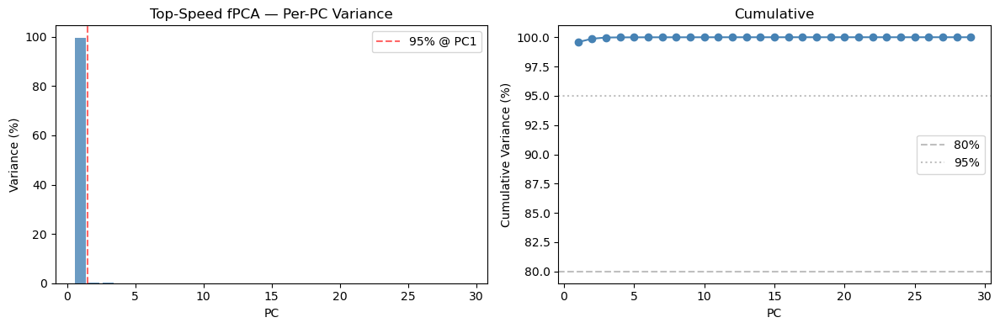

95% variance: 1 PCs


In [8]:
# ── Scree plot: visualise how much variance each PC captures ──────────────────
# A "scree plot" shows the importance of each PC.
# Typically the first few PCs capture a lot; then it drops off (the "elbow").
# Left panel: variance per individual PC.  Right panel: cumulative total.

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
x = range(1, n_comp + 1)   # PC numbers: 1, 2, 3, ...

# Left: bar chart — each bar = one PC's share of total variance
ax1.bar(x, explained * 100, color='steelblue', alpha=0.8)
ax1.set(xlabel='PC', ylabel='Variance (%)', title='Top-Speed fPCA — Per-PC Variance')
ax1.axvline(n_95 + 0.5, color='red', ls='--', alpha=0.6, label=f'95% @ PC{n_95}')
ax1.legend()

# Right: running total — shows how many PCs you need to capture 80% or 95%
ax2.plot(x, cumvar * 100, 'o-', color='steelblue')
for thr, ls in [(80, '--'), (95, ':')]:
    ax2.axhline(thr, ls=ls, color='grey', alpha=0.5, label=f'{thr}%')
ax2.set(xlabel='PC', ylabel='Cumulative Variance (%)', title='Cumulative')
ax2.legend()

plt.tight_layout()
fig.savefig(FIG_DIR / 'scree_topspeed.png', dpi=150, bbox_inches='tight')
plt.show()
print(f"95% variance: {n_95} PCs")


### Scree Plot

- **Left**: per-PC variance — steep early drop = few PCs capture most kinematic signal.
- **Right**: cumulative variance; dashed line at 95%. PCs past the elbow are mostly noise.
- Retained PCs (stepwise regression) feed the downstream ML notebook.


In [9]:
# ── Reconstruction helpers: turn PC scores back into skeleton postures ─────────
# After PCA, any skeleton can be recreated as:
#   skeleton = mean_stride + score_PC1 * shape_PC1 + score_PC2 * shape_PC2 + ...
#
# Two flavours:
#   SCR (Single-Component Reconstruction): vary ONE PC, keep rest at group median
#   MCR (Multi-Component Reconstruction):  combine ALL retained PCs together


def reconstruct_percentile(mu, fpca, scores, pc_idx, percentile):
    # SCR: reconstruct the stride at the Nth percentile of one PC.
    #
    # mu         : (19392,) mean stride
    # fpca       : fitted PCA object
    # scores     : (N, n_comp) PC scores for all participants
    # pc_idx     : which PC to vary (0-based, so PC1 = index 0)
    # percentile : e.g. 5 = slow end, 95 = fast end
    # Returns    : (19392,) reconstructed stride vector
    return mu + np.percentile(scores[:, pc_idx], percentile) * fpca.components_[pc_idx]


def reconstruct_mcr(mu, fpca, scores, retained_pcs, percentile):
    # MCR: reconstruct by summing contributions from all retained PCs.
    #
    # retained_pcs : list of PC indices (e.g. [0, 2] for PC1 and PC3)
    # percentile   : applied to each PC independently
    # Returns      : (19392,) reconstructed stride vector
    recon = mu.copy()   # start from the group mean
    for pc in retained_pcs:
        recon += np.percentile(scores[:, pc], percentile) * fpca.components_[pc]
    return recon


# ── Roundtrip sanity check ────────────────────────────────────────────────────
# Confirm that vector_to_frames and frames_to_vector perfectly undo each other.
_row0   = dataset[0]
_frames = vector_to_frames(_row0)
_rt     = frames_to_vector(_frames)
assert np.allclose(_rt, _row0), "vector_to_frames <-> frames_to_vector roundtrip failed!"
print(f"Roundtrip OK  |  shape={_frames.shape}  |  markers={'64-mk c3d' if _frames.shape[1]==64 else '23-seg'}")

# Quick MCR check: reconstruct slow (5th %ile), median (50th), and fast (95th)
for pct in [5, 50, 95]:
    v = reconstruct_mcr(mu, fpca, scores, RETAINED_PCS, pct)
    f = vector_to_frames(v)
    print(f"  MCR {pct:3d}th %ile  Y=[{f[:,:,1].min():.3f}, {f[:,:,1].max():.3f}]")


Roundtrip OK  |  shape=(101, 64, 3)  |  markers=64-mk c3d
  MCR   5th %ile  Y=[-0.229, 0.603]
  MCR  50th %ile  Y=[-0.356, 0.499]
  MCR  95th %ile  Y=[-0.453, 0.464]


In [10]:
# ── Kinogram drawing infrastructure ────────────────────────────────────────────
# Ported from sprint_fPCA_pipeline.ipynb (GitHub ref notebook) and adapted for
# our axis convention: X=forward, Y=lateral, Z=up (Chris V. alignment).

# 64-marker bone polylines (0-based, from xsens_scr_frame.m)
SKELETON_BONES = [
    [1,2,4,3,1,5,6,2,6,7,5,7,8,9,10,13,15,20,11,14,10,14,20,14,21,14,11,21,15],
    [21,10], [20,10], [16,17,18,16,19,17,19,18,19,15],
    [20,22,23,28,23,20], [20,28,26,28,27,26],
    [23,26,23,27,26], [22,26,22,27,26],
    [26,32,27,32,33,32,34,32,33,26],
    [21,24,25,24,31,21], [21,25],
    [29,30,24,29,24,30,24,25,29,25,30,25],
    [31,29,30,29,31,30,31],
    [29,35,29,36,29,37,35,36,30,35,30,36,30,37,30],
    [38,39,38,40,38,41,40,39,41,46,39,46,40,46],
    [46,47,46,48], [39,47,39,48], [40,47,40,48],
    [47,48,52,47,52,53,52,54,52,55,56,55,57,52],
    [42,43,42,44,42,45,44,43,45],
    [49,45,49,44,49,43,49], [49,50,49,51,49],
    [43,50,43,51,43], [44,50,44,51,44],
    [50,51,50,58,51,58,59,58,59,58,61,58,60,61,62,61,63],
]

# Colours
COLOR_SLOW = '#d62728'     # red
COLOR_MED  = '#1a1a1a'     # near-black
COLOR_FAST = '#1f77b4'     # blue

# Axis indices in our data (post Chris-V alignment)
_AP, _ML, _VERT = 0, 1, 2   # X=forward, Y=lateral, Z=up

# Marker groups for pelvis centroid
MK_PELVIS_ALL = [0, 1, 2, 3, 4, 5, 6]
MK_HEAD       = [16, 17, 18, 19]


def draw_skeleton_proj(ax, frame, plane='sagittal',
                       color='k', alpha=0.7, lw=1.5, ms=2.5,
                       label=None, self_center=True, scale=SCALE_MM):
    """Draw one skeleton frame projected onto a 2-D plane.
    frame: (64, 3) — already in (forward, lateral, up) convention.
    plane: 'sagittal' → X vs Z, 'frontal' → Y vs Z.
    """
    pts = frame * scale if scale != 1.0 else frame.copy()

    # Self-centre on pelvis for overlay comparisons
    if self_center:
        pelvis = np.mean(pts[MK_PELVIS_ALL], axis=0)
        pts = pts - pelvis

    if plane == 'sagittal':
        x_scr, y_scr = pts[:, _AP], pts[:, _VERT]
    elif plane == 'frontal':
        x_scr, y_scr = pts[:, _ML], pts[:, _VERT]
    else:  # transverse
        x_scr, y_scr = pts[:, _ML], pts[:, _AP]

    first = True
    for bone in SKELETON_BONES:
        for j in range(len(bone) - 1):
            a, b = bone[j], bone[j + 1]
            if a < len(pts) and b < len(pts):
                lbl = label if first else None
                ax.plot([x_scr[a], x_scr[b]], [y_scr[a], y_scr[b]],
                        color=color, alpha=alpha, lw=lw, label=lbl,
                        solid_capstyle='round')
                first = False
    # Marker dots
    ax.scatter(x_scr, y_scr, s=ms**2, color=color, alpha=alpha*0.7, zorder=5)


def draw_ground_line(ax, *frames_list, plane='sagittal', scale=SCALE_MM):
    """Draw a horizontal ground line at the lowest foot across all skeletons."""
    foot_mks = [MK_R_HEEL, MK_L_HEEL, MK_R_TOE, MK_L_TOE]
    y_min = float('inf')
    x_all = []
    for fr in frames_list:
        pts = fr * scale if scale != 1.0 else fr.copy()
        if True:  # self-centered
            pelvis = np.mean(pts[MK_PELVIS_ALL], axis=0)
            pts = pts - pelvis
        for mk in foot_mks:
            y_min = min(y_min, pts[mk, _VERT])
        if plane == 'sagittal':
            x_all.extend(pts[:, _AP].tolist())
        else:
            x_all.extend(pts[:, _ML].tolist())
    xlo, xhi = min(x_all) - 100, max(x_all) + 100
    ax.plot([xlo, xhi], [y_min - 5, y_min - 5], 'k-', lw=1.5, alpha=0.25, zorder=0)


def get_skeleton_height(frame, scale=SCALE_MM):
    """Pelvis-to-head distance in one frame (for height normalisation)."""
    pts = frame * scale
    head_c   = np.mean(pts[MK_HEAD], axis=0)
    pelvis_c = np.mean(pts[MK_PELVIS_ALL], axis=0)
    return np.linalg.norm(head_c - pelvis_c)


def scale_to_avg_height(frames_list):
    """Scale each participant's frames so all share the same avg height."""
    heights = [get_skeleton_height(f[0]) for f in frames_list]
    avg_h   = np.mean(heights)
    scaled  = []
    for f, h in zip(frames_list, heights):
        if h > 0:
            scaled.append(f * (avg_h / h))
        else:
            scaled.append(f.copy())
    return scaled


print("Kinogram drawing infrastructure loaded.")


Kinogram drawing infrastructure loaded.


In [11]:
# ── ALTIS 5-Phase Top-Speed Stride Event Detection ────────────────────────────
# The ALTIS kinogram shows the skeleton at 5 standardised positions within
# the sprint stride cycle (R-heel contact to next R-heel contact = 0-100%).
#
# Phase definitions (ALTIS coaching framework, kinogrampro.com):
#   Touch-Down    : initial ground contact of stance foot
#   Full-Support  : pelvis directly over support foot (midstance)
#   Toe-Off       : last frame the stance foot is touching the ground
#                   (detected as the peak of the R-shank backward tilt:
#                   knee maximally ahead of ankle = leg fully pushing off)
#   MVP           : Maximum Vertical Projection — recovery-leg knee at peak
#                   forward position relative to pelvis (figure-4 recovery)
#   Strike        : swing leg extended forward, preparing pawback for next TD

ALTIS_ORDER = ['Touch-Down', 'Full-Support', 'Toe-Off', 'MVP', 'Strike']


def detect_altis_events_from_frames(frames):
    """Detect the 5 ALTIS phase frame indices on a 101-frame stride.

    Toe-Off is anchored to the peak of R-shank backward tilt
    (knee_AP - ankle_AP). At toe-off the stance leg is fully extended in
    push-off, so the knee sits furthest ahead of the ankle. This signal
    is scale-invariant and robust to fPCA averaging.
    """
    n = frames.shape[0]

    pelvis_xyz = np.mean(frames[:, MK_PELVIS_ALL, :], axis=1)
    pelvis_z   = pelvis_xyz[:, _VERT]
    pelvis_ap  = pelvis_xyz[:, _AP]
    r_heel     = frames[:, MK_R_HEEL, :]
    r_knee_ap  = np.mean(frames[:, MK_R_KNEE, _AP], axis=1)
    r_ankle_ap = np.mean(frames[:, MK_R_ANKLE, _AP], axis=1)

    # 1) Touch-Down -----------------------------------------------------------
    td = 0

    # 3) Toe-Off — peak of R-shank backward tilt (knee ahead of ankle) -------
    shank_tilt = r_knee_ap - r_ankle_ap   # positive = knee forward of ankle
    search_hi  = min(n, int(n * 0.45))
    if search_hi > 4:
        toe_off = int(np.argmax(shank_tilt[2:search_hi])) + 2
    else:
        toe_off = int(n * 0.22)
    toe_off = int(np.clip(toe_off, int(n * 0.16), int(n * 0.32)))

    # 2) Full-Support: pelvis-Z minimum between TD and Toe-Off ---------------
    fs_lo = 2
    fs_hi = max(fs_lo + 3, toe_off - 1)
    full_support = fs_lo + int(np.argmin(pelvis_z[fs_lo:fs_hi]))
    full_support = max(full_support, 3)

    # 4) MVP: R-knee furthest forward of pelvis during swing (figure-4) ------
    swing_lo = toe_off + 2
    swing_hi = min(n, int(n * 0.80))
    if swing_hi > swing_lo:
        knee_fwd = r_knee_ap[swing_lo:swing_hi] - pelvis_ap[swing_lo:swing_hi]
        mvp      = swing_lo + int(np.argmax(knee_fwd))
    else:
        mvp = min(n - 5, toe_off + max(1, int(n * 0.30)))
    mvp = int(np.clip(mvp, int(n * 0.50), int(n * 0.72)))

    # 5) Strike: R-heel furthest forward of pelvis, post-MVP -----------------
    str_lo = mvp + 2
    str_hi = max(str_lo + 2, n)
    rel_fwd_heel = r_heel[str_lo:str_hi, _AP] - pelvis_ap[str_lo:str_hi]
    strike       = str_lo + int(np.argmax(rel_fwd_heel))
    strike       = int(np.clip(strike, int(n * 0.78), n - 1))

    return {
        'Touch-Down':   td,
        'Full-Support': full_support,
        'Toe-Off':      max(toe_off,    full_support + 2),
        'MVP':          max(mvp,        toe_off + 4),
        'Strike':       min(max(strike, mvp + 4), n - 1),
    }


print("ALTIS event detector (Toe-Off = peak shank backward tilt) loaded.")


ALTIS event detector (Toe-Off = peak shank backward tilt) loaded.


  M: slowest=8.51 (SB25), median=9.21 (SB73), fastest=10.02 (SB101)
  F: slowest=7.00 (SB202), median=7.98 (SB102), fastest=8.69 (SB161)
  M detected ALTIS frames:
    Touch-Down      slow=  0  med=  0  fast=  0
    Full-Support    slow=  4  med=  3  fast=  3
    Toe-Off         slow= 29  med= 17  fast= 17
    MVP             slow= 72  med= 50  fast= 50
    Strike          slow= 91  med= 93  fast= 93


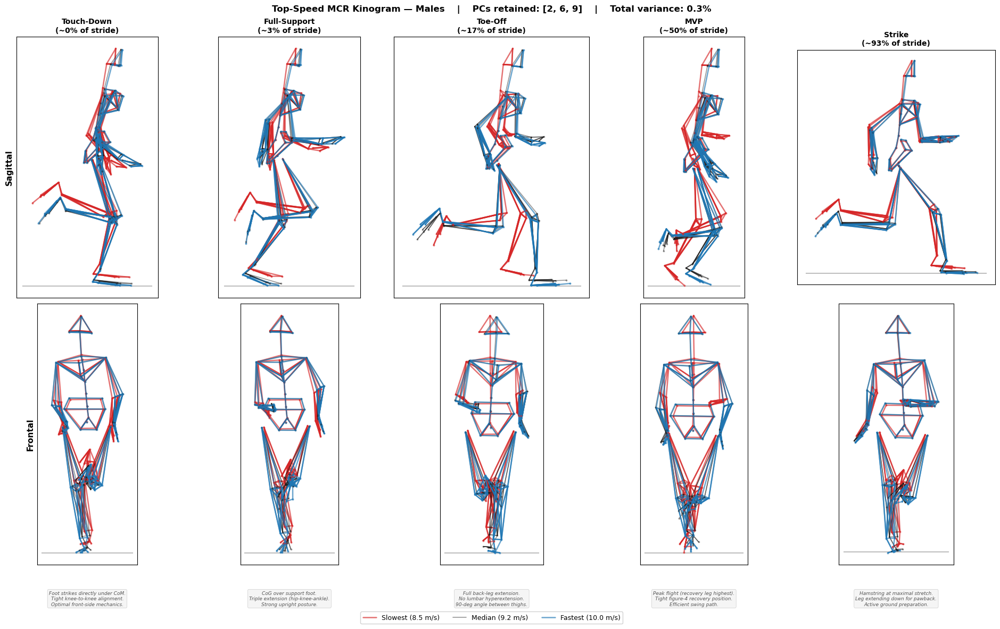

Saved: kinogram_topspeed_mcr_M.png
  F detected ALTIS frames:
    Touch-Down      slow=  0  med=  0  fast=  0
    Full-Support    slow=  7  med=  3  fast=  4
    Toe-Off         slow= 31  med= 16  fast= 17
    MVP             slow= 72  med= 50  fast= 50
    Strike          slow= 83  med= 93  fast= 93


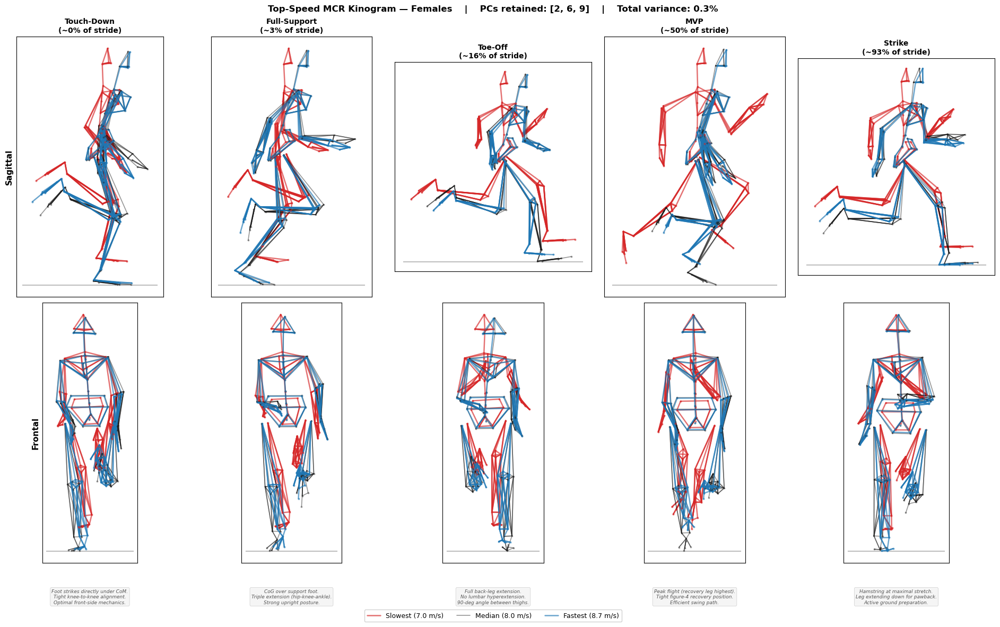

Saved: kinogram_topspeed_mcr_F.png

Top-speed ALTIS kinograms complete.


In [12]:
# ── Top-Speed MCR Kinogram: ALTIS 5 Phases × Slowest/Median/Fastest ──────────
# Multi-Component Reconstruction using retained PCs with actual participant
# scores.  ALTIS phase frames detected per participant from the reconstructed
# stride data using detect_altis_events_from_frames().

ALTIS_CUES = {
    'Touch-Down':   "Foot strikes directly under CoM.\nTight knee-to-knee alignment.\nOptimal front-side mechanics.",
    'Full-Support': "CoG over support foot.\nTriple extension (hip-knee-ankle).\nStrong upright posture.",
    'Toe-Off':      "Full back-leg extension.\nNo lumbar hyperextension.\n90-deg angle between thighs.",
    'MVP':          "Peak flight (recovery leg highest).\nTight figure-4 recovery position.\nEfficient swing path.",
    'Strike':       "Hamstring at maximal stretch.\nLeg extending down for pawback.\nActive ground preparation.",
}

# ── Find representative participants per sex ─────────────────────────────────
sex_reps = {}
for sex_label in ['M', 'F']:
    mask    = meta_df['sex'] == sex_label
    sex_idx = meta_df.index[mask].tolist()
    if len(sex_idx) < 3:
        continue
    vels = [(i, float(meta_df.loc[i, 'max_velocity_ms'])) for i in sex_idx]
    vels.sort(key=lambda x: x[1])
    sex_reps[sex_label] = {
        'slowest': (vels[0][0],            vels[0][1],            meta_df.loc[vels[0][0], 'participant_id']),
        'median':  (vels[len(vels)//2][0], vels[len(vels)//2][1], meta_df.loc[vels[len(vels)//2][0], 'participant_id']),
        'fastest': (vels[-1][0],           vels[-1][1],           meta_df.loc[vels[-1][0], 'participant_id']),
    }
    s = sex_reps[sex_label]
    print(f"  {sex_label}: slowest={s['slowest'][1]:.2f} ({s['slowest'][2]}), "
          f"median={s['median'][1]:.2f} ({s['median'][2]}), "
          f"fastest={s['fastest'][1]:.2f} ({s['fastest'][2]})")

# ── Generate kinogram figures ────────────────────────────────────────────────
for sex_label, reps in sex_reps.items():
    sex_name = 'Males' if sex_label == 'M' else 'Females'
    si_slow, v_slow, pid_slow = reps['slowest']
    si_med,  v_med,  pid_med  = reps['median']
    si_fast, v_fast, pid_fast = reps['fastest']

    # MCR: reconstruct using ALL retained PCs with actual participant scores
    recon_slow = mu.copy()
    recon_med  = mu.copy()
    recon_fast = mu.copy()
    for pc_idx in RETAINED_PCS:
        recon_slow += scores[si_slow, pc_idx] * fpca.components_[pc_idx]
        recon_med  += scores[si_med,  pc_idx] * fpca.components_[pc_idx]
        recon_fast += scores[si_fast, pc_idx] * fpca.components_[pc_idx]

    fr_slow = vector_to_frames(recon_slow)
    fr_med  = vector_to_frames(recon_med)
    fr_fast = vector_to_frames(recon_fast)

    # Height-normalise so the three reps are directly comparable
    fr_slow, fr_med, fr_fast = scale_to_avg_height([fr_slow, fr_med, fr_fast])

    # ALTIS events detected from the data, per participant
    ev_slow = detect_altis_events_from_frames(fr_slow)
    ev_med  = detect_altis_events_from_frames(fr_med)
    ev_fast = detect_altis_events_from_frames(fr_fast)

    # Show detected percentages for transparency
    print(f"  {sex_label} detected ALTIS frames:")
    for nm in ALTIS_ORDER:
        print(f"    {nm:<14s}  slow={ev_slow[nm]:3d}  med={ev_med[nm]:3d}  fast={ev_fast[nm]:3d}")

    n_cols = len(ALTIS_ORDER)
    planes = ['sagittal', 'frontal']
    fig, axes = plt.subplots(len(planes), n_cols,
                             figsize=(3.8 * n_cols, 5.7 * len(planes)),
                             constrained_layout=True)

    handles_global, labels_global = [], []
    for row, plane in enumerate(planes):
        for col, ev_name in enumerate(ALTIS_ORDER):
            ax = axes[row, col]
            fi_s = ev_slow[ev_name]
            fi_m = ev_med [ev_name]
            fi_f = ev_fast[ev_name]
            pct  = ev_med[ev_name] / (fr_med.shape[0] - 1) * 100

            l_s = f'Slowest ({v_slow:.1f} m/s)' if (col == 0 and row == 0) else None
            l_m = f'Median ({v_med:.1f} m/s)'   if (col == 0 and row == 0) else None
            l_f = f'Fastest ({v_fast:.1f} m/s)' if (col == 0 and row == 0) else None

            draw_skeleton_proj(ax, fr_slow[fi_s], plane=plane,
                color=COLOR_SLOW, alpha=0.65, lw=1.8, ms=2.0, label=l_s)
            draw_skeleton_proj(ax, fr_med [fi_m], plane=plane,
                color=COLOR_MED,  alpha=0.45, lw=1.2, ms=1.8, label=l_m)
            draw_skeleton_proj(ax, fr_fast[fi_f], plane=plane,
                color=COLOR_FAST, alpha=0.65, lw=1.8, ms=2.0, label=l_f)

            draw_ground_line(ax, fr_slow[fi_s], fr_med[fi_m], fr_fast[fi_f], plane=plane)

            ax.set_aspect('equal'); ax.grid(alpha=0.2, lw=0.5)
            ax.set_xticks([]); ax.set_yticks([])

            if row == 0:
                ax.set_title(f"{ev_name}\n(~{pct:.0f}% of stride)", fontsize=10, fontweight='bold')
            if col == 0:
                ax.set_ylabel('Sagittal' if plane == 'sagittal' else 'Frontal',
                              fontsize=11, fontweight='bold')
                if row == 0:
                    h, lbls = ax.get_legend_handles_labels()
                    handles_global, labels_global = h, lbls

            # Coaching cue below bottom row
            if row == len(planes) - 1:
                cue = ALTIS_CUES.get(ev_name, '')
                ax.text(0.5, -0.10, cue, transform=ax.transAxes,
                        fontsize=6.5, ha='center', va='top', style='italic',
                        color='#555555',
                        bbox=dict(boxstyle='round,pad=0.3', facecolor='#f5f5f5',
                                  edgecolor='#cccccc', lw=0.5))

    fig.suptitle(
        f"Top-Speed MCR Kinogram — {sex_name}    |    "
        f"PCs retained: {[p+1 for p in RETAINED_PCS]}    |    "
        f"Total variance: {sum(fpca.explained_variance_ratio_[i] for i in RETAINED_PCS)*100:.1f}%",
        fontsize=12, fontweight='bold')

    if handles_global:
        fig.legend(handles_global, labels_global,
                   loc='lower center', bbox_to_anchor=(0.5, -0.03),
                   ncol=3, fontsize=9, frameon=True, framealpha=0.9)

    out_path = FIG_DIR / f"kinogram_topspeed_mcr_{sex_label}.png"
    fig.savefig(str(out_path), dpi=200, bbox_inches='tight', facecolor='white')
    plt.show()
    print(f"Saved: {out_path.name}")

print("\nTop-speed ALTIS kinograms complete.")


In [13]:
# ── Acceleration Raw Data Extraction ──────────────────────────────────────────
# Re-process each C3D file to extract:
#   1. Block clearance single frames (rear foot clearance, rear ankle cross,
#      front foot clearance)
#   2. Individual acceleration strides (steps 1-16) with events
#      (touchdown, ankle cross, take-off)
#
# Definitions from "Sprint Blocks Kinogram.xlsx" (Kinogram Notes sheet):
#   Rear Foot Clearance  : first frame rear foot leaves the block
#   Rear Ankle Cross     : rear foot crosses the knee of the front leg
#   Front Foot Clearance : first frame front foot leaves the blocks
#   Step N Touchdown     : Nth step contacts the ground
#   Ankle Cross          : swing leg crosses stance knee
#   Take-Off             : stance foot leaves ground

def detect_block_clearance_events(raw64, fs):
    """Detect block-clearance events in the first ~1.5s of aligned sprint data.

    raw64: (n_frames, 64, 3) — aligned, trimmed, origin at rear heel.
    Axes: 0=AP, 1=ML, 2=Vert.

    Returns (event_dict, rear_mk, front_mk).
    """
    n = raw64.shape[0]
    first_sec = min(n, int(fs * 1.5))   # search within first 1.5 seconds

    r_heel_z = raw64[:first_sec, MK_R_HEEL, _VERT]
    l_heel_z = raw64[:first_sec, MK_L_HEEL, _VERT]
    r_heel_x = raw64[:first_sec, MK_R_HEEL, _AP]
    l_heel_x = raw64[:first_sec, MK_L_HEEL, _AP]

    # Determine which foot is rear (further back in AP at frame 0)
    if r_heel_x[0] <= l_heel_x[0]:
        rear_heel_z, front_heel_z = r_heel_z, l_heel_z
        rear_heel_x, front_heel_x = r_heel_x, l_heel_x
        rear_mk, front_mk = MK_R_HEEL, MK_L_HEEL
        rear_knee_mks  = [39, 40]   # R knee markers
        front_knee_mks = [43, 44]   # L knee markers
    else:
        rear_heel_z, front_heel_z = l_heel_z, r_heel_z
        rear_heel_x, front_heel_x = l_heel_x, r_heel_x
        rear_mk, front_mk = MK_L_HEEL, MK_R_HEEL
        rear_knee_mks  = [43, 44]
        front_knee_mks = [39, 40]

    ev = {}

    # Rear Foot Clearance: first frame rear heel rises > 5mm above initial
    rear_init_z = rear_heel_z[0]
    for i in range(1, len(rear_heel_z)):
        if rear_heel_z[i] > rear_init_z + 0.005:
            ev['Rear Foot Clearance'] = i
            break
    if 'Rear Foot Clearance' not in ev:
        ev['Rear Foot Clearance'] = 2

    # Rear Ankle Cross: rear heel AP crosses the front knee AP
    front_knee_x = np.mean(raw64[:first_sec, front_knee_mks, _AP], axis=1)
    rear_heel_ap = raw64[:first_sec, rear_mk, _AP]
    for i in range(ev['Rear Foot Clearance'], len(rear_heel_ap)):
        if rear_heel_ap[i] >= front_knee_x[i]:
            ev['Rear Ankle Cross'] = i
            break
    if 'Rear Ankle Cross' not in ev:
        ev['Rear Ankle Cross'] = ev['Rear Foot Clearance'] + 5

    # Front Foot Clearance: first frame front heel rises > 5mm above initial
    front_init_z = front_heel_z[0]
    for i in range(ev['Rear Ankle Cross'], len(front_heel_z)):
        if front_heel_z[i] > front_init_z + 0.005:
            ev['Front Foot Clearance'] = i
            break
    if 'Front Foot Clearance' not in ev:
        ev['Front Foot Clearance'] = ev['Rear Ankle Cross'] + 5

    return ev, rear_mk, front_mk


def detect_accel_strides(raw64, fs, max_strides=8, start_frame=0):
    """Detect individual stride boundaries in the acceleration phase.

    start_frame : frame index to begin searching for ground contacts.
                  Pass `front_foot_clearance + buffer` so the first detected
                  contact is the first real step out of the blocks (not a
                  false minimum while the foot is still in the block).

    Returns (steps_list, step_events_list) where each step_event has
    {step, foot, Touchdown, Ankle Cross, Take-Off}.
    """
    n = raw64.shape[0]

    r_heel_z = raw64[:, MK_R_HEEL, _VERT]
    l_heel_z = raw64[:, MK_L_HEEL, _VERT]

    from scipy.signal import find_peaks
    r_contacts, _ = find_peaks(-r_heel_z, distance=15, prominence=0.01)
    l_contacts, _ = find_peaks(-l_heel_z, distance=15, prominence=0.01)

    # Skip contacts that happen before the athlete has cleared the blocks
    r_contacts = r_contacts[r_contacts >= start_frame]
    l_contacts = l_contacts[l_contacts >= start_frame]

    # Merge into a single chronological list
    all_contacts = sorted(list(r_contacts) + list(l_contacts))

    # Identify which foot each contact belongs to
    contacts_with_foot = []
    for c in all_contacts:
        # whichever heel sits lower at this contact is the stance foot
        foot = 'R' if r_heel_z[c] <= l_heel_z[c] else 'L'
        contacts_with_foot.append((c, foot))

    # Remove contacts too close together (de-duplicate)
    cleaned = [contacts_with_foot[0]] if contacts_with_foot else []
    for c, f in contacts_with_foot[1:]:
        if c - cleaned[-1][0] > 8:
            cleaned.append((c, f))

    # Enforce alternating feet — the first step out of blocks alternates each step
    if len(cleaned) >= 2:
        alternated = [cleaned[0]]
        for c, f in cleaned[1:]:
            if f != alternated[-1][1]:
                alternated.append((c, f))
            else:
                # same-foot consecutive contact = spurious; keep only stronger one
                prev_c, prev_f = alternated[-1]
                if r_heel_z[c] + l_heel_z[c] < r_heel_z[prev_c] + l_heel_z[prev_c]:
                    alternated[-1] = (c, f)
        cleaned = alternated

    steps = cleaned[:2 * max_strides + 1]

    step_events = []
    for i in range(len(steps) - 1):
        td_frame, td_foot = steps[i]
        next_td, _        = steps[i + 1]

        if td_foot == 'R':
            stance_heel = MK_R_HEEL; stance_toe = MK_R_TOE
            swing_heel  = MK_L_HEEL; stance_knee = [39, 40]
        else:
            stance_heel = MK_L_HEEL; stance_toe = MK_L_TOE
            swing_heel  = MK_R_HEEL; stance_knee = [43, 44]

        mid = (td_frame + next_td) // 2

        # Ankle Cross: swing heel AP crosses stance knee AP
        swing_ap       = raw64[td_frame:mid, swing_heel, _AP]
        stance_knee_ap = np.mean(raw64[td_frame:mid, stance_knee, _AP], axis=1)
        ac_frame       = td_frame
        for k in range(len(swing_ap)):
            if swing_ap[k] >= stance_knee_ap[k]:
                ac_frame = td_frame + k
                break
        else:
            ac_frame = td_frame + max(1, len(swing_ap) // 2)

        # Take-Off: stance toe leaves ground (Z rises above minimum + threshold)
        toe_z       = raw64[td_frame:next_td, stance_toe, _VERT]
        toe_min_idx = int(np.argmin(toe_z))
        to_frame    = td_frame + toe_min_idx
        for k in range(toe_min_idx, len(toe_z)):
            if toe_z[k] > toe_z[toe_min_idx] + 0.005:
                to_frame = td_frame + k
                break

        step_events.append({
            'step':        i + 1,
            'foot':        td_foot,
            'Touchdown':   td_frame,
            'Ankle Cross': min(ac_frame, to_frame - 1),
            'Take-Off':    min(to_frame, next_td - 1),
        })

    return steps, step_events


# ── Extract acceleration data for each participant ────────────────────────────
accel_raw = {}   # pid -> {raw64, fs, block_events, step_events, steps}

for fpath in tqdm(sorted(C3D_DIR.glob("*.c3d")), desc="Accel extraction"):
    pid = fpath.stem.split("-")[0].strip()
    if pid in EXCLUDED_PIDS or pid not in velocity_traces:
        continue

    try:
        mk, raw64, fs = load_c3d(fpath)
        mk, raw64 = perform_pca_alignment(mk, raw64)
        start = detect_sprint_start(mk, fs)
        mk    = mk[start:];  raw64 = raw64[start:]
        mk    = shift_origin(mk)
        r_x = raw64[0, MK_R_HEEL, _AP]; l_x = raw64[0, MK_L_HEEL, _AP]
        orig  = raw64[0, MK_R_HEEL if r_x <= l_x else MK_L_HEEL].copy()
        raw64 = raw64 - orig
        mk    = trim_sprint(mk)
        raw64 = raw64[:mk.shape[0]]

        # Block clearance events
        blk_ev, rear_mk, front_mk = detect_block_clearance_events(raw64, fs)

        # Stride/step events — START AFTER front foot leaves the blocks so that
        # Step 1 TD is the first real ground contact, not a pre-block minimum.
        step_search_start = blk_ev.get('Front Foot Clearance', 0) + int(fs * 0.05)
        steps, step_events = detect_accel_strides(raw64, fs,
                                                  max_strides=8,
                                                  start_frame=step_search_start)

        accel_raw[pid] = {
            'raw64':         raw64,
            'fs':            fs,
            'block_events':  blk_ev,
            'step_events':   step_events,
            'steps':         steps,
            'rear_mk':       rear_mk,
            'front_mk':      front_mk,
        }
    except Exception as e:
        print(f"  SKIP {pid}: {e}")

print(f"\nAcceleration data extracted for {len(accel_raw)} participants.")

# Show block clearance + first step summary
for pid in sorted(list(accel_raw.keys()))[:5]:
    d = accel_raw[pid]
    blk = d['block_events']
    step1_td = d['step_events'][0]['Touchdown'] if d['step_events'] else None
    print(f"  {pid}: FFC={blk.get('Front Foot Clearance')}  "
          f"Step1 TD={step1_td}  steps detected={len(d['step_events'])}")


Accel extraction:   0%|          | 0/31 [00:00<?, ?it/s]


Acceleration data extracted for 30 participants.
  SB061: FFC=13  Step1 TD=20  steps detected=16
  SB101: FFC=14  Step1 TD=28  steps detected=16
  SB102: FFC=16  Step1 TD=24  steps detected=16
  SB110: FFC=13  Step1 TD=21  steps detected=16
  SB111: FFC=16  Step1 TD=20  steps detected=16


  Accel M: slow=8.51 (SB25), med=9.21 (SB73), fast=10.02 (SB101)
  Accel F: slow=7.00 (SB202), med=7.98 (SB102), fast=8.69 (SB161)


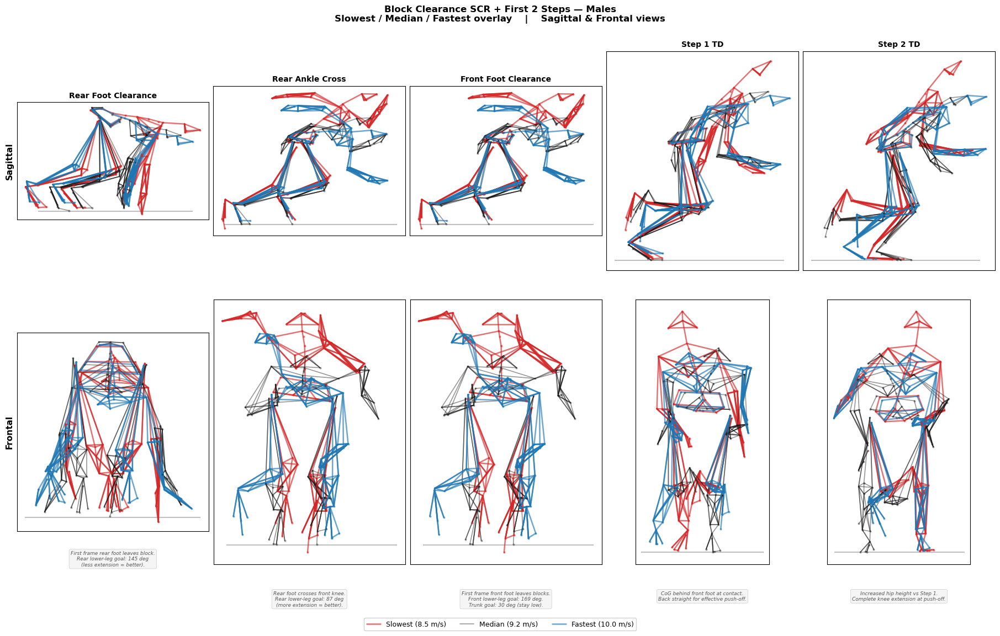

Saved: kinogram_block_scr_M.png


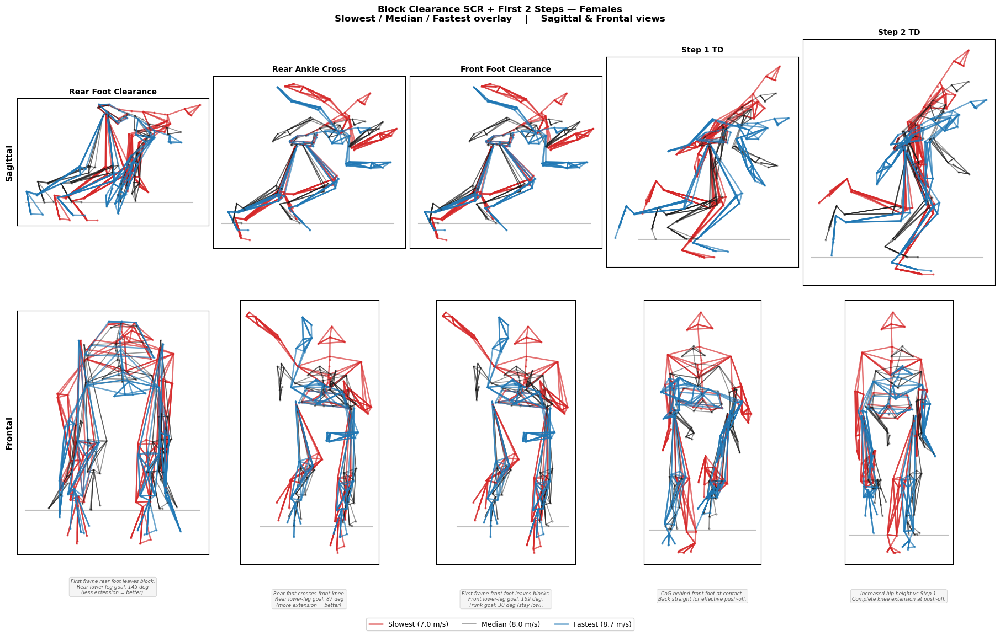

Saved: kinogram_block_scr_F.png


In [14]:
# ── Block Clearance SCR: Rear Foot Clearance / Rear Ankle Cross / Front Foot Clearance
# + First 2 Steps SCR (overlaid slowest / median / fastest) ───────────────────

BLOCK_CUE = {
    'Rear Foot Clearance': (
        "First frame rear foot leaves block.\n"
        "Rear lower-leg goal: 145 deg\n"
        "(less extension = better)."
    ),
    'Rear Ankle Cross': (
        "Rear foot crosses front knee.\n"
        "Rear lower-leg goal: 87 deg\n"
        "(more extension = better)."
    ),
    'Front Foot Clearance': (
        "First frame front foot leaves blocks.\n"
        "Front lower-leg goal: 169 deg.\n"
        "Trunk goal: 30 deg (stay low)."
    ),
}

STEP_CUE = {
    'Step 1': "CoG behind front foot at contact.\nBack straight for effective push-off.",
    'Step 2': "Increased hip height vs Step 1.\nComplete knee extension at push-off.",
}

# ── Find accel slow/med/fast per sex ──────────────────────────────────────────
accel_sex_reps = {}
for sex_label in ['M', 'F']:
    pids_sex = [pid for pid in accel_raw
                if PARTICIPANT_SEX.get(pid, '?') == sex_label]
    if len(pids_sex) < 3:
        continue
    vels = [(pid, velocity_traces[pid]['peak_vel']) for pid in pids_sex]
    vels.sort(key=lambda x: x[1])
    accel_sex_reps[sex_label] = {
        'slowest': vels[0],
        'median':  vels[len(vels) // 2],
        'fastest': vels[-1],
    }
    print(f"  Accel {sex_label}: slow={vels[0][1]:.2f} ({vels[0][0]}), "
          f"med={vels[len(vels)//2][1]:.2f} ({vels[len(vels)//2][0]}), "
          f"fast={vels[-1][1]:.2f} ({vels[-1][0]})")

# ── Block Clearance SCR ───────────────────────────────────────────────────────
blk_events_ordered = ['Rear Foot Clearance', 'Rear Ankle Cross', 'Front Foot Clearance']

for sex_label, reps_a in accel_sex_reps.items():
    sex_name = 'Males' if sex_label == 'M' else 'Females'
    pid_slow, v_slow = reps_a['slowest']
    pid_med,  v_med  = reps_a['median']
    pid_fast, v_fast = reps_a['fastest']

    n_cols = len(blk_events_ordered) + 2   # +2 for Step 1, Step 2
    planes = ['sagittal', 'frontal']
    fig, axes = plt.subplots(len(planes), n_cols,
                             figsize=(3.6 * n_cols, 5.5 * len(planes)),
                             constrained_layout=True)

    col_labels    = blk_events_ordered + ['Step 1 TD', 'Step 2 TD']
    handles_global, labels_global = [], []

    for row, plane in enumerate(planes):
        for col, col_lbl in enumerate(col_labels):
            ax = axes[row, col]

            for pid, vel, color, alpha, lw, role in [
                (pid_slow, v_slow, COLOR_SLOW, 0.65, 1.8, 'Slowest'),
                (pid_med,  v_med,  COLOR_MED,  0.45, 1.2, 'Median'),
                (pid_fast, v_fast, COLOR_FAST, 0.65, 1.8, 'Fastest')
            ]:
                d   = accel_raw[pid]
                lbl = f'{role} ({vel:.1f} m/s)' if (col == 0 and row == 0) else None

                if col < 3:
                    # Block clearance: single frame for that event
                    ev_name = blk_events_ordered[col]
                    fi      = d['block_events'].get(ev_name, 0)
                else:
                    # Step touchdown
                    step_idx = col - 3   # 0 or 1
                    if step_idx < len(d['step_events']):
                        fi = d['step_events'][step_idx]['Touchdown']
                    else:
                        fi = 0

                fi = min(int(fi), d['raw64'].shape[0] - 1)
                draw_skeleton_proj(ax, d['raw64'][fi], plane=plane,
                    color=color, alpha=alpha, lw=lw, ms=2.0, label=lbl,
                    scale=SCALE_MM)

            # Ground line using median as reference
            d_ref = accel_raw[pid_med]
            if col < 3:
                ref_fi = d_ref['block_events'].get(blk_events_ordered[col], 0)
            else:
                step_idx = col - 3
                if step_idx < len(d_ref['step_events']):
                    ref_fi = d_ref['step_events'][step_idx]['Touchdown']
                else:
                    ref_fi = 0
            ref_fi = min(int(ref_fi), d_ref['raw64'].shape[0] - 1)
            draw_ground_line(ax, d_ref['raw64'][ref_fi], plane=plane, scale=SCALE_MM)

            ax.set_aspect('equal'); ax.grid(alpha=0.2, lw=0.5)
            ax.set_xticks([]); ax.set_yticks([])

            if row == 0:
                ax.set_title(col_lbl, fontsize=10, fontweight='bold', pad=6)
            if col == 0:
                ax.set_ylabel('Sagittal' if plane == 'sagittal' else 'Frontal',
                              fontsize=11, fontweight='bold')
                if row == 0:
                    h, lbls = ax.get_legend_handles_labels()
                    handles_global, labels_global = h, lbls

            if row == len(planes) - 1:
                if col < 3:
                    cue = BLOCK_CUE.get(blk_events_ordered[col], '')
                else:
                    cue = STEP_CUE.get(f'Step {col - 2}', '')
                if cue:
                    ax.text(0.5, -0.10, cue, transform=ax.transAxes,
                            fontsize=6.5, ha='center', va='top', style='italic',
                            color='#555555',
                            bbox=dict(boxstyle='round,pad=0.3', facecolor='#f5f5f5',
                                      edgecolor='#cccccc', lw=0.5))

    fig.suptitle(
        f"Block Clearance SCR + First 2 Steps — {sex_name}\n"
        "Slowest / Median / Fastest overlay    |    Sagittal & Frontal views",
        fontsize=12, fontweight='bold')

    if handles_global:
        fig.legend(handles_global, labels_global,
                   loc='lower center', bbox_to_anchor=(0.5, -0.04),
                   ncol=3, fontsize=9, frameon=True, framealpha=0.9)

    out_path = FIG_DIR / f"kinogram_block_scr_{sex_label}.png"
    fig.savefig(str(out_path), dpi=200, bbox_inches='tight', facecolor='white')
    plt.show()
    print(f"Saved: {out_path.name}")


  M Steps 3-8: rep step indices slow=5, med=5, fast=5


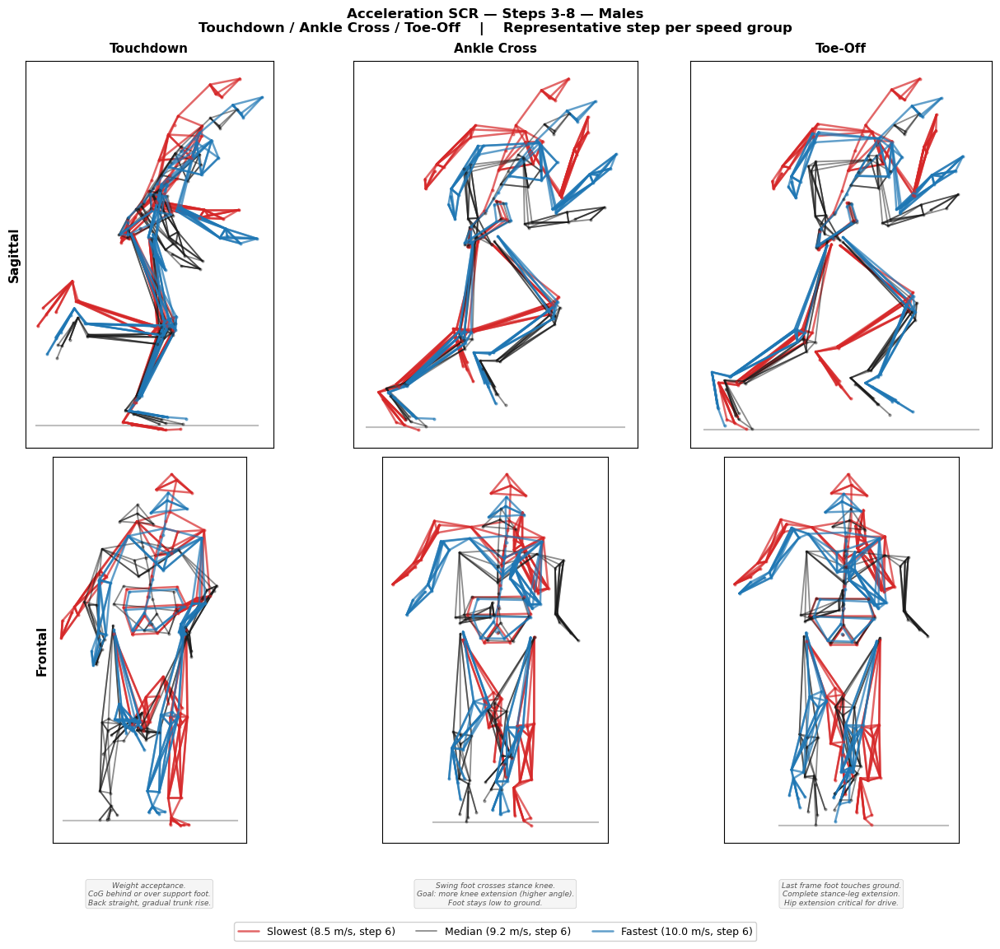

Saved: kinogram_accel_scr_steps_3-8_M.png
  M Steps 9-16: rep step indices slow=12, med=12, fast=12


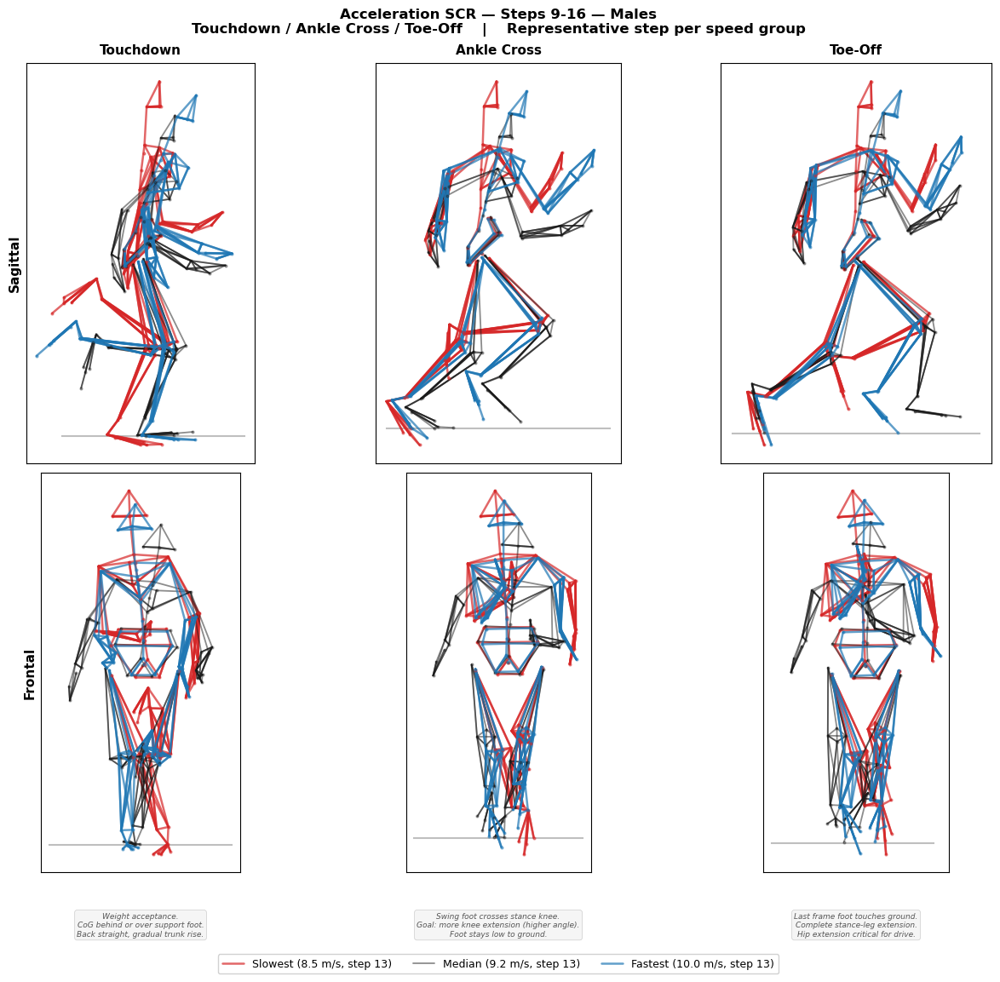

Saved: kinogram_accel_scr_steps_9-16_M.png
  F Steps 3-8: rep step indices slow=5, med=5, fast=5


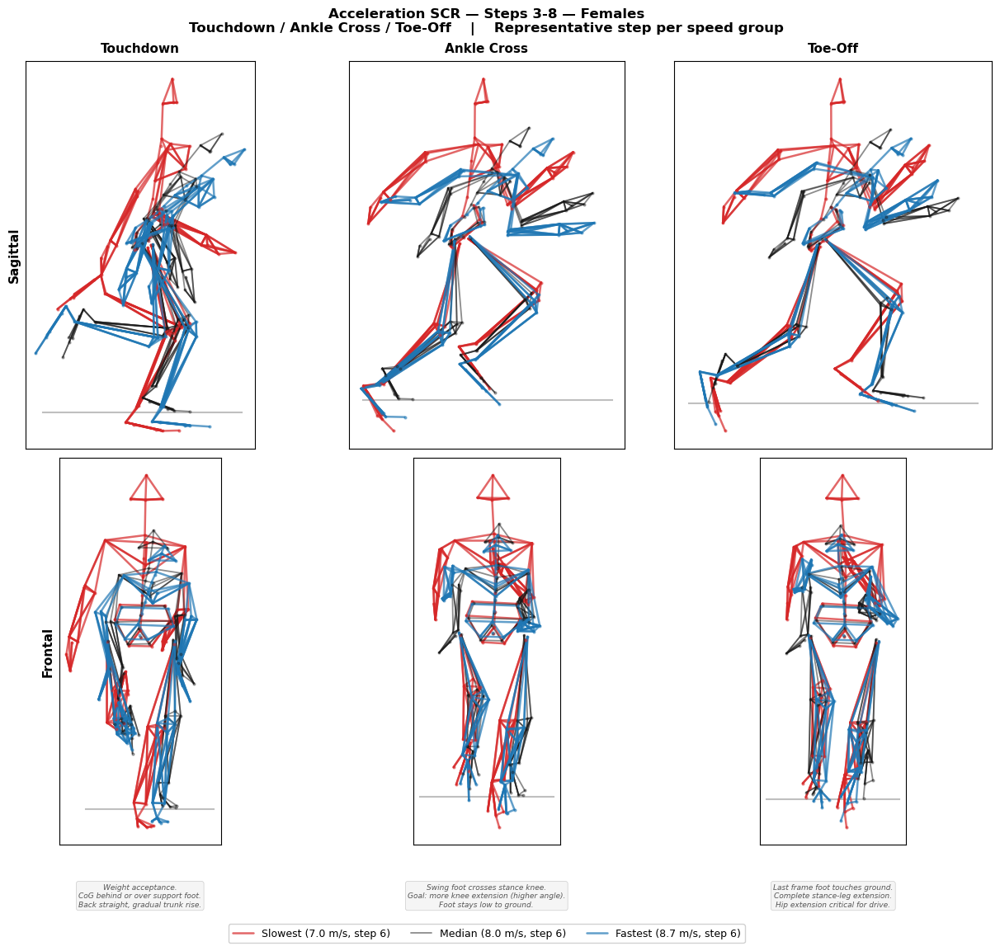

Saved: kinogram_accel_scr_steps_3-8_F.png
  F Steps 9-16: rep step indices slow=12, med=12, fast=12


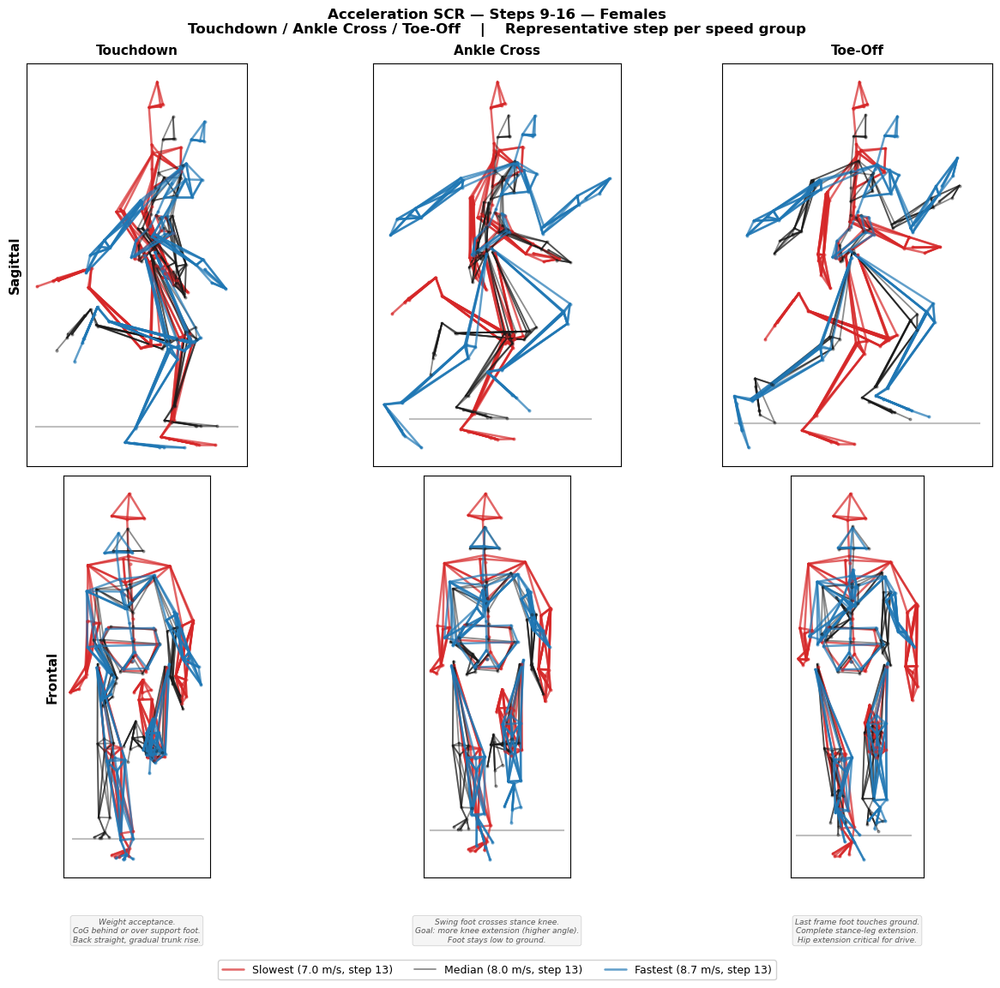

Saved: kinogram_accel_scr_steps_9-16_F.png

Acceleration SCR kinograms complete.


In [15]:
# ── Acceleration SCR: Steps 3-8 and Steps 9-16 ───────────────────────────────
# Stride 1 (Steps 1-2) is already covered by the Block Clearance SCR figure,
# so this view skips it. For each (sex × stride group) we pick ONE representative
# step (the middle of the group) and draw the SAME step at three events:
#   Touchdown / Ankle Cross / Toe-Off
# with the slowest, median and fastest sprinter overlayed at each event.
#
# Showing a single representative step (instead of averaging across all
# strides in the group) preserves the arm swing and joint kinematics that
# averaging smears out.

ACCEL_SCR_CUE = {
    'Touchdown':   "Weight acceptance.\nCoG behind or over support foot.\nBack straight, gradual trunk rise.",
    'Ankle Cross': "Swing foot crosses stance knee.\nGoal: more knee extension (higher angle).\nFoot stays low to ground.",
    'Toe-Off':     "Last frame foot touches ground.\nComplete stance-leg extension.\nHip extension critical for drive.",
}

STEP_GROUPS = [
    ('Steps 3-8',  2,  8),    # step indices 2..7  (strides 2-4)
    ('Steps 9-16', 8, 16),    # step indices 8..15 (strides 5-8)
]

# step_events stores the event under 'Take-Off' — re-label as 'Toe-Off' for display
accel_events_ordered = [('Touchdown',   'Touchdown'),
                        ('Ankle Cross', 'Ankle Cross'),
                        ('Take-Off',    'Toe-Off')]


def _pick_rep_step(d, lo, hi):
    """Return the middle step index in [lo, hi) that actually exists for d."""
    n_steps = len(d['step_events'])
    avail   = list(range(lo, min(hi, n_steps)))
    if not avail:
        return None
    return avail[len(avail) // 2]


for sex_label, reps_a in accel_sex_reps.items():
    sex_name = 'Males' if sex_label == 'M' else 'Females'
    pid_slow, v_slow = reps_a['slowest']
    pid_med,  v_med  = reps_a['median']
    pid_fast, v_fast = reps_a['fastest']

    for group_name, step_lo, step_hi in STEP_GROUPS:
        rep_s = _pick_rep_step(accel_raw[pid_slow], step_lo, step_hi)
        rep_m = _pick_rep_step(accel_raw[pid_med],  step_lo, step_hi)
        rep_f = _pick_rep_step(accel_raw[pid_fast], step_lo, step_hi)

        print(f"  {sex_label} {group_name}: rep step indices "
              f"slow={rep_s}, med={rep_m}, fast={rep_f}")

        n_cols = len(accel_events_ordered)
        planes = ['sagittal', 'frontal']
        fig, axes = plt.subplots(len(planes), n_cols,
                                 figsize=(4.2 * n_cols, 5.5 * len(planes)),
                                 constrained_layout=True)

        handles_global, labels_global = [], []

        for row, plane in enumerate(planes):
            for col, (ev_key, ev_label) in enumerate(accel_events_ordered):
                ax = axes[row, col]

                want_lbl = (col == 0 and row == 0)
                for pid, vel, color, alpha, lw, role, rep_idx in [
                    (pid_slow, v_slow, COLOR_SLOW, 0.70, 1.8, 'Slowest', rep_s),
                    (pid_med,  v_med,  COLOR_MED,  0.50, 1.3, 'Median',  rep_m),
                    (pid_fast, v_fast, COLOR_FAST, 0.70, 1.8, 'Fastest', rep_f),
                ]:
                    if rep_idx is None:
                        continue
                    d  = accel_raw[pid]
                    se = d['step_events'][rep_idx]
                    fi = se.get(ev_key, se.get('Touchdown', 0))
                    fi = min(int(fi), d['raw64'].shape[0] - 1)

                    step_num_disp = rep_idx + 1
                    lbl = (f'{role} ({vel:.1f} m/s, step {step_num_disp})'
                           if want_lbl else None)

                    draw_skeleton_proj(ax, d['raw64'][fi], plane=plane,
                        color=color, alpha=alpha, lw=lw, ms=2.0, label=lbl,
                        scale=SCALE_MM)

                # Ground line from the median's frame
                if rep_m is not None:
                    d_ref = accel_raw[pid_med]
                    se_ref = d_ref['step_events'][rep_m]
                    fi_ref = min(int(se_ref.get(ev_key, se_ref.get('Touchdown', 0))),
                                 d_ref['raw64'].shape[0] - 1)
                    draw_ground_line(ax, d_ref['raw64'][fi_ref],
                                     plane=plane, scale=SCALE_MM)

                ax.set_aspect('equal'); ax.grid(alpha=0.2, lw=0.5)
                ax.set_xticks([]); ax.set_yticks([])

                if row == 0:
                    ax.set_title(ev_label, fontsize=11, fontweight='bold', pad=8)
                if col == 0:
                    ax.set_ylabel('Sagittal' if plane == 'sagittal' else 'Frontal',
                                  fontsize=11, fontweight='bold')
                    if row == 0:
                        h, lbls = ax.get_legend_handles_labels()
                        handles_global, labels_global = h, lbls

                if row == len(planes) - 1:
                    cue = ACCEL_SCR_CUE.get(ev_label, '')
                    ax.text(0.5, -0.10, cue, transform=ax.transAxes,
                            fontsize=6.5, ha='center', va='top', style='italic',
                            color='#555555',
                            bbox=dict(boxstyle='round,pad=0.3', facecolor='#f5f5f5',
                                      edgecolor='#cccccc', lw=0.5))

        fig.suptitle(
            f"Acceleration SCR — {group_name} — {sex_name}\n"
            "Touchdown / Ankle Cross / Toe-Off    |    Representative step per speed group",
            fontsize=12, fontweight='bold')

        if handles_global:
            fig.legend(handles_global, labels_global,
                       loc='lower center', bbox_to_anchor=(0.5, -0.04),
                       ncol=3, fontsize=9, frameon=True, framealpha=0.9)

        tag      = group_name.replace(' ', '_').lower()   # "steps_3-8"
        out_path = FIG_DIR / f"kinogram_accel_scr_{tag}_{sex_label}.png"
        fig.savefig(str(out_path), dpi=200, bbox_inches='tight', facecolor='white')
        plt.show()
        print(f"Saved: {out_path.name}")

print("\nAcceleration SCR kinograms complete.")


In [ ]:
# ── Acceleration fPCA per step range (3-8 and 9-16) ───────────────────────────
# Build per-participant time-normalised mean strides for Steps 3-8 and 9-16,
# then run fPCA on each step range to find the kinematic patterns that
# discriminate fast vs slow sprinters during early vs late acceleration.
# Renders fast / median / slow skeleton overlay figures × 3 cohorts
# (Males / Females / All) × 2 step ranges = 6 figures.

from scipy.signal import find_peaks as _find_peaks

STEP_RANGES = {
    "steps_3-8":  (3, 8),
    "steps_9-16": (9, 16),
}

def _extended_contacts(raw64, fs, max_steps=16, start_frame=0):
    """Detect up to max_steps step touchdowns with alternating feet."""
    r_z = raw64[:, MK_R_HEEL, 2]
    l_z = raw64[:, MK_L_HEEL, 2]
    r_c, _ = _find_peaks(-r_z, distance=15, prominence=0.01)
    l_c, _ = _find_peaks(-l_z, distance=15, prominence=0.01)
    r_c = r_c[r_c >= start_frame]; l_c = l_c[l_c >= start_frame]
    all_c = sorted(list(r_c) + list(l_c))
    cwf = [(c, "R" if r_z[c] <= l_z[c] else "L") for c in all_c]
    cleaned = [cwf[0]] if cwf else []
    for c, f in cwf[1:]:
        if c - cleaned[-1][0] > 8:
            cleaned.append((c, f))
    if len(cleaned) >= 2:
        alt = [cleaned[0]]
        for c, f in cleaned[1:]:
            if f != alt[-1][1]:
                alt.append((c, f))
            else:
                prev_c = alt[-1][0]
                if r_z[c] + l_z[c] < r_z[prev_c] + l_z[prev_c]:
                    alt[-1] = (c, f)
        cleaned = alt
    return cleaned[: max_steps + 1]


def _stride_window(raw64, td_frame, next_td, target_len=TN_POINTS):
    seg = raw64[td_frame:next_td]
    n_in = seg.shape[0]
    if n_in < 3:
        return None
    src_x = np.linspace(0.0, 1.0, n_in); tgt_x = np.linspace(0.0, 1.0, target_len)
    out = np.zeros((target_len, 64, 3))
    for m in range(64):
        for a in range(3):
            out[:, m, a] = np.interp(tgt_x, src_x, seg[:, m, a])
    return out


# Build per-participant mean stride per step range from accel_raw
range_data = {k: {} for k in STEP_RANGES}
for pid, d in accel_raw.items():
    raw64 = d["raw64"]; fs = d["fs"]
    sstart = d["block_events"].get("Front Foot Clearance", 0) + int(fs * 0.05)
    contacts = _extended_contacts(raw64, fs, max_steps=16, start_frame=sstart)
    if len(contacts) < 4:
        continue
    for rng, (lo, hi) in STEP_RANGES.items():
        strides = []
        for step_i in range(lo - 1, min(hi, len(contacts) - 1)):
            td, _ = contacts[step_i]; nxt, _ = contacts[step_i + 1]
            w = _stride_window(raw64, td, nxt)
            if w is not None:
                strides.append(w)
        if strides:
            range_data[rng][pid] = np.mean(strides, axis=0)

for k, dct in range_data.items():
    print(f"  {k}: {len(dct)} participants with valid strides")

# fPCA + scree per range
from sklearn.decomposition import PCA
fpca_results = {}
for rng, per_pid in range_data.items():
    pids = sorted(per_pid.keys())
    X = np.stack([per_pid[p].reshape(-1) for p in pids])
    y = np.array([velocity_traces[p]["peak_vel"] for p in pids])
    mu = X.mean(axis=0); Xc = X - mu
    n_comp = min(15, len(pids) - 1)
    pca = PCA(n_components=n_comp, random_state=RANDOM_SEED)
    scores = pca.fit_transform(Xc)
    corrs = np.array([np.corrcoef(scores[:, k], y)[0, 1] for k in range(n_comp)])
    fpca_results[rng] = dict(pids=pids, scores=scores, pca=pca, y=y, corrs=corrs)

    pd.DataFrame(scores, index=pids,
                 columns=[f"PC{k+1}" for k in range(n_comp)]) \
        .assign(peak_vel_ms=y) \
        .to_csv(DATA_DIR / f"accel_fpca_{rng}_scores.csv")

    fig, (a1, a2) = plt.subplots(1, 2, figsize=(11, 4))
    xs = range(1, n_comp + 1)
    a1.bar(xs, pca.explained_variance_ratio_ * 100, color="#e07b54", alpha=0.85)
    a1.set(xlabel="PC", ylabel="Variance (%)",
           title=f"fPCA — {rng} — Per-PC Variance")
    a2.bar(xs, np.abs(corrs), color="#4c72b0", alpha=0.85)
    for k, c in enumerate(corrs):
        a2.text(k + 1, abs(c) + 0.01, f"{c:+.2f}", ha="center", fontsize=7,
                color="#4c72b0" if c > 0 else "#c44e52")
    a2.set(xlabel="PC", ylabel="|r| with peak velocity",
           title=f"fPCA — {rng} — Correlation w/ peak velocity")
    a2.set_ylim(0, max(0.6, np.abs(corrs).max() * 1.25))
    plt.tight_layout()
    fig.savefig(FIG_DIR / f"accel_fpca_{rng}_scree.png", dpi=140, bbox_inches="tight")
    plt.show()
    print(f"  {rng}: top-3 |r|={np.abs(corrs)[:3].round(2)}  "
          f"cumvar(3)={pca.explained_variance_ratio_[:3].sum()*100:.1f}%")

# Render fast/median/slow overlay figures: 2 ranges × 3 cohorts = 6 figures
import sys as _sys
_sys.path.insert(0, str(SCRIPT_DIR))
from sprint_animation import AXIAL_IDX, RIGHT_IDX, LEFT_IDX

COLOR_SLOW = "#c44e52"; COLOR_MED = "#666666"; COLOR_FAST = "#3a76b3"
PHASE_POINTS = [("Touchdown", 0), ("Mid-Stance", 35), ("Toe-Off", 70)]


def _draw_overlay(ax, pts, color, alpha, lw, plane):
    if plane == "xz":
        h, v = pts[:, 0], pts[:, 2]
    else:
        h, v = pts[:, 1], pts[:, 2]
    for poly in AXIAL_IDX + RIGHT_IDX + LEFT_IDX:
        ax.plot(h[poly], v[poly], color=color, lw=lw, alpha=alpha,
                solid_capstyle="round")


def _render_overlay(rng, cohort_label, pids, per_pid):
    if len(pids) < 3:
        return
    ranked = sorted(pids, key=lambda p: velocity_traces[p]["peak_vel"])
    slow_p, fast_p = ranked[0], ranked[-1]
    med_p = ranked[len(ranked) // 2]
    v_s, v_m, v_f = (velocity_traces[p]["peak_vel"] for p in (slow_p, med_p, fast_p))
    s_s = per_pid[slow_p] * SCALE_MM
    s_m = per_pid[med_p]  * SCALE_MM
    s_f = per_pid[fast_p] * SCALE_MM

    fig, axes = plt.subplots(2, 3, figsize=(13.5, 8.5), constrained_layout=True)
    rows = ["Sagittal", "Frontal"]
    for row, (rname, plane) in enumerate(zip(rows, ["xz", "yz"])):
        for col, (pname, fidx) in enumerate(PHASE_POINTS):
            ax = axes[row, col]
            for stride, color, alpha, lw in [
                (s_s, COLOR_SLOW, 0.75, 1.8),
                (s_m, COLOR_MED,  0.55, 1.2),
                (s_f, COLOR_FAST, 0.75, 1.8),
            ]:
                pts = stride[fidx].copy()
                # Centre horizontally (X, Y) on pelvis; keep Z natural; then
                # drop so the lowest foot point sits at z = 0 (the floor).
                centre = pts[MK_PELVIS].copy(); centre[2] = 0.0
                pts = pts - centre
                pts[:, 2] = pts[:, 2] - pts[:, 2].min()
                _draw_overlay(ax, pts, color, alpha, lw, plane=plane)
            ax.axhline(0, color="#999999", lw=0.8, alpha=0.6, zorder=0)
            if row == 0: ax.set_title(pname, fontsize=11, pad=6)
            if col == 0: ax.set_ylabel(rname, fontsize=11, fontweight="bold")
            ax.set_aspect("equal", adjustable="box"); ax.grid(True, alpha=0.25)
            ax.tick_params(labelsize=8)
            if plane == "xz":
                ax.set_xlim(-900, 1100); ax.set_ylim(-50, 2050)
            else:
                ax.set_xlim(-800, 800); ax.set_ylim(-50, 2050)
    fpca = fpca_results[rng]
    top_pc = int(np.argmax(np.abs(fpca["corrs"]))) + 1
    top_r  = fpca["corrs"][top_pc - 1]
    top_ev = fpca["pca"].explained_variance_ratio_[top_pc - 1] * 100
    pretty = {"M": "Males", "F": "Females", "all": "All Participants"}[cohort_label]
    fig.suptitle(
        f"Acceleration fPCA — {rng.replace('_', ' ').replace('steps', 'Steps')} "
        f"— {pretty}  (n = {len(pids)})\n"
        f"Strongest velocity-correlated component: PC{top_pc}  "
        f"({top_ev:.1f}% var, r = {top_r:+.2f} with peak velocity)",
        fontsize=12, fontweight="bold")
    handles = [
        plt.Line2D([], [], color=COLOR_SLOW, lw=2.5, label=f"Slowest ({v_s:.1f} m/s)"),
        plt.Line2D([], [], color=COLOR_MED,  lw=2.0, label=f"Median ({v_m:.1f} m/s)"),
        plt.Line2D([], [], color=COLOR_FAST, lw=2.5, label=f"Fastest ({v_f:.1f} m/s)"),
    ]
    fig.legend(handles=handles, loc="lower center", ncol=3,
               bbox_to_anchor=(0.5, -0.02), fontsize=10, frameon=False)
    fig.savefig(FIG_DIR / f"accel_fpca_{rng}_{cohort_label}.png",
                dpi=140, bbox_inches="tight")
    plt.show()
    print(f"  wrote accel_fpca_{rng}_{cohort_label}.png  "
          f"(slow={slow_p}/{v_s:.1f}, med={med_p}/{v_m:.1f}, fast={fast_p}/{v_f:.1f})")


for rng, per_pid in range_data.items():
    cohorts = {
        "M":   [p for p in per_pid if PARTICIPANT_SEX.get(p) == "M"],
        "F":   [p for p in per_pid if PARTICIPANT_SEX.get(p) == "F"],
        "all": list(per_pid.keys()),
    }
    for c_label, pid_list in cohorts.items():
        _render_overlay(rng, c_label, pid_list, per_pid)


# ── PC1 shape-mode figure (always shown, per step range) ──────────────────────
# Render a 4-panel ±2SD motion-envelope visualization of PC1's shape mode for
# each step range.  This ensures PC1 is visualized even when a different PC
# happens to be the strongest velocity-correlated component for that range.

def _render_pc1_shape_mode(range_name):
    res = fpca_results[range_name]
    pca = res["pca"]
    pids = res["pids"]
    Xs = np.stack([range_data[range_name][p].reshape(-1) for p in pids])
    mu_3d = Xs.mean(axis=0).reshape(TN_POINTS, 64, 3)
    pc1_loading = pca.components_[0].reshape(TN_POINTS, 64, 3)
    pc1_sd = np.sqrt(pca.explained_variance_[0])
    r1  = res["corrs"][0]
    ev1 = pca.explained_variance_ratio_[0] * 100

    fast_is_positive = (r1 > 0)
    pos_color = "#3a76b3" if fast_is_positive else "#c44e52"
    neg_color = "#c44e52" if fast_is_positive else "#3a76b3"
    pos_label = "Faster" if fast_is_positive else "Slower"
    neg_label = "Slower" if fast_is_positive else "Faster"

    plus_recon  = mu_3d + 2.0 * pc1_sd * pc1_loading
    minus_recon = mu_3d - 2.0 * pc1_sd * pc1_loading

    fig, axes = plt.subplots(2, 2, figsize=(11.5, 11), constrained_layout=True)
    panel_cfg = [
        (0, 0, "Sagittal", "xz", minus_recon, neg_color, f"− 2 SD  ({neg_label})"),
        (0, 1, "Sagittal", "xz", plus_recon,  pos_color, f"+ 2 SD  ({pos_label})"),
        (1, 0, "Frontal",  "yz", minus_recon, neg_color, f"− 2 SD  ({neg_label})"),
        (1, 1, "Frontal",  "yz", plus_recon,  pos_color, f"+ 2 SD  ({pos_label})"),
    ]
    for r, c, plane_name, plane_code, recon, color, panel_title in panel_cfg:
        ax = axes[r, c]
        for fi in range(TN_POINTS):
            pts = (recon[fi] * SCALE_MM).copy()
            centre = pts[MK_PELVIS].copy(); centre[2] = 0.0
            pts = pts - centre
            pts[:, 2] = pts[:, 2] - pts[:, 2].min()
            _draw_overlay(ax, pts, color, alpha=0.12, lw=0.9, plane=plane_code)
        pts = (recon[35] * SCALE_MM).copy()
        centre = pts[MK_PELVIS].copy(); centre[2] = 0.0
        pts = pts - centre
        pts[:, 2] = pts[:, 2] - pts[:, 2].min()
        _draw_overlay(ax, pts, color, alpha=0.95, lw=1.8, plane=plane_code)
        ax.axhline(0, color="#999999", lw=0.8, alpha=0.6, zorder=0)
        ax.set_title(panel_title, fontsize=11, color=color, fontweight="bold")
        if c == 0:
            ax.set_ylabel(plane_name, fontsize=11, fontweight="bold")
        ax.set_aspect("equal", adjustable="box")
        ax.grid(True, alpha=0.25); ax.tick_params(labelsize=8)
        if plane_code == "xz":
            ax.set_xlim(-900, 1100); ax.set_ylim(-50, 2050)
        else:
            ax.set_xlim(-800, 800); ax.set_ylim(-50, 2050)

    pretty = range_name.replace("_", " ").replace("steps", "Steps")
    arrow = "blue" if fast_is_positive else "red"
    fig.suptitle(
        f"Acceleration fPCA — {pretty} — PC1 Shape Mode\n"
        f"{ev1:.1f}% variance  •  r = {r1:+.2f} with peak velocity  "
        f"(faster sprinter side shown in {arrow})",
        fontsize=12, fontweight="bold")
    out = FIG_DIR / f"accel_fpca_{range_name}_PC1.png"
    fig.savefig(out, dpi=140, bbox_inches="tight")
    plt.show()
    print(f"  wrote accel_fpca_{range_name}_PC1.png  (PC1: {ev1:.1f}% var, r={r1:+.2f})")


for rng in STEP_RANGES:
    _render_pc1_shape_mode(rng)


---
## 3D Skeleton Visualisation (PyVista)


Slow: SB202  (7.00 m/s)
Med : SB161   (8.69 m/s)
Fast: SB101  (10.02 m/s)


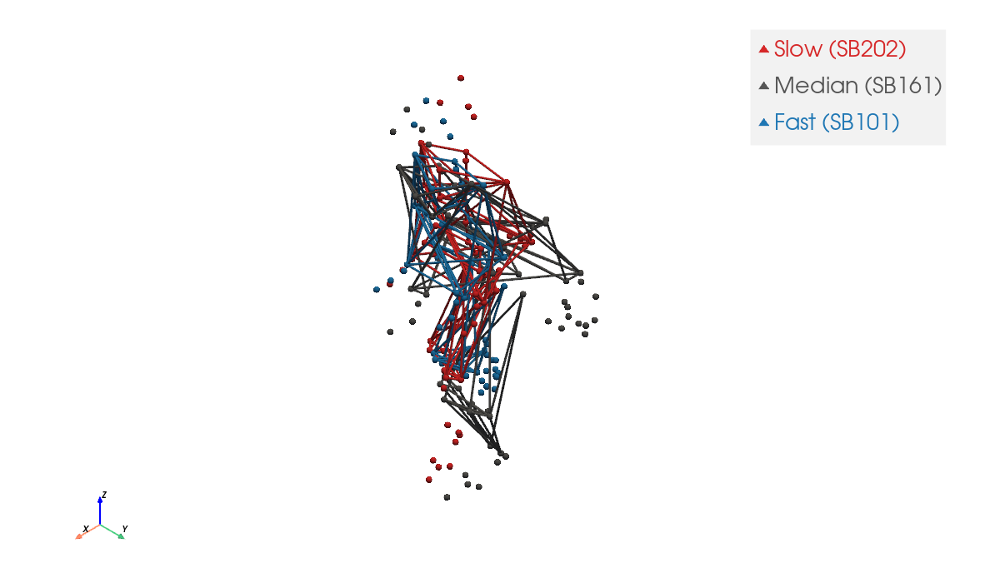

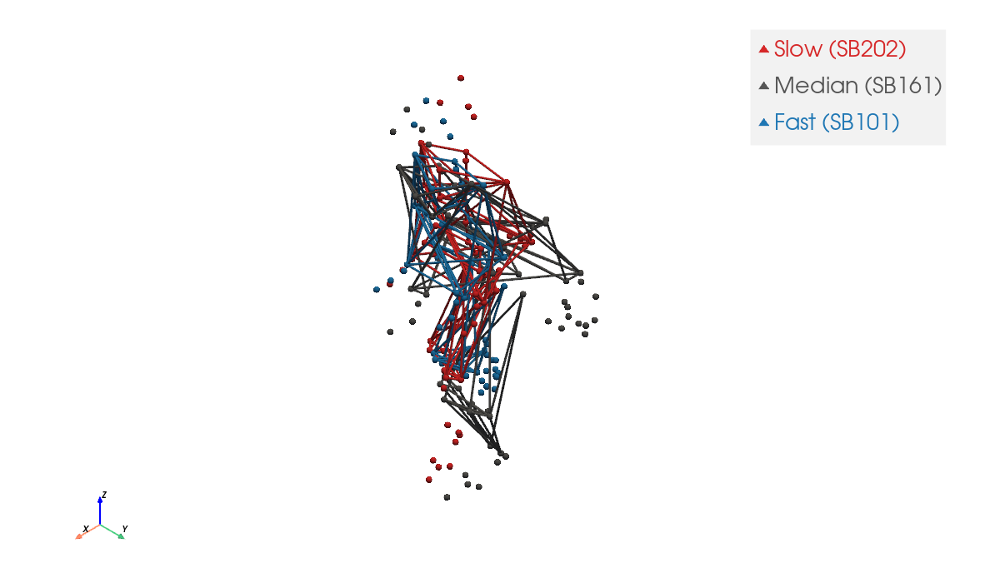

In [16]:
# ── 3D skeleton visualisation using PyVista ───────────────────────────────────
# This cell draws an interactive 3D skeleton for the slow, median, and fast
# sprinters.  You can click and drag in the window to rotate/zoom the view.
#
# We define which markers are connected by "bones" (lines).
# The MATLAB code uses 1-based polylines; we convert them to 0-based Python edge pairs.

# ── Convert MATLAB 1-based polylines -> 0-based (a, b) edge pairs ─────────────
# Each _RAW_* list is a polyline: a chain of marker indices forming a body part.
# e.g. [21, 23, 24] means "draw marker21->marker23, then marker23->marker24"
_RAW_AXIAL = [2,3,5,4,2,6,7,3,7,8,6,8,9,10,11,14,16,21,12,15,11,15,21,15,22,15,12,22,16]
_RAW_R_UE  = [[21,23,24,29,24,21],[21,29,27,29,28,27],[21,25,24,21,27,24,25,23,24],[22,23,30,31,30,22]]
_RAW_L_UE  = [[22,25,26,30,26,22],[22,30,28,30,29,28],[22,26,25,22,28,25,26,24,25],[23,24,31,32,31,23]]
_RAW_R_LE  = [[1,40,41,42,40,41,42,40,43,44,42,44],[40,48,41,48,42,48,43,48]]
_RAW_L_LE  = [[1,44,45,46,44,45,46,44,47,1,46,47],[44,49,45,49,46,49,47,49]]

def _edges_from_polyline(pl):
    # Convert a polyline of 1-based indices into a list of 0-based edge pairs.
    # pl      : list of integers (1-based marker numbers, as in MATLAB)
    # Returns : list of (a, b) tuples where a and b are 0-based Python indices
    edges = []
    for i in range(len(pl)-1):
        a, b = pl[i]-1, pl[i+1]-1   # subtract 1 to convert 1-based -> 0-based
        if a != b:                   # skip self-loops (same marker twice in a row)
            edges.append((a, b))
    return edges

# Combine all polylines, convert to edges, and remove any duplicates
_ALL_POLYLINES = [_RAW_AXIAL] + _RAW_R_UE + _RAW_L_UE + _RAW_R_LE + _RAW_L_LE
EDGES = []
for pl in _ALL_POLYLINES:
    EDGES.extend(_edges_from_polyline(pl))
EDGES = list(set(tuple(sorted(e)) for e in EDGES))   # deduplicate


def make_skeleton_mesh(pts_64):
    # Build a PyVista line-mesh (set of connected bone segments) from 64 marker positions.
    #
    # pts_64  : (64, 3) array of marker xyz positions at one time frame
    # Returns : a pyvista.PolyData object ready for 3D rendering

    # PyVista connectivity format: [n_pts_in_edge, idx_a, idx_b, ...]
    lines = []
    for a, b in EDGES:
        if a < pts_64.shape[0] and b < pts_64.shape[0]:
            lines += [2, a, b]   # 2 = "this edge connects 2 points"
    mesh = pv.PolyData()
    mesh.points = pts_64
    if lines:
        mesh.lines = np.array(lines, dtype=np.intp)
    return mesh


def plot_skeleton_3d(vectors, labels, colors, frame=50, scale=SCALE_MM,
                     window_size=(1200, 700), off_screen=False):
    # Render K skeletons overlaid in a single 3D PyVista window.
    #
    # vectors     : list of 1-D arrays of length 19392, one per skeleton
    # labels      : list of display names shown in the legend
    # colors      : list of colour strings (e.g. "#d62728") or (R, G, B) tuples
    # frame       : which time frame (0..100) to display (50 = mid-stance)
    # scale       : multiply positions by this before displaying (1000 = metres to mm)
    # off_screen  : if True, render without opening a window (for saving images)

    pl = pv.Plotter(window_size=window_size, off_screen=off_screen)
    pl.set_background("white")

    for vec, lbl, col in zip(vectors, labels, colors):
        frames = vector_to_frames(vec)    # reshape: 19392 -> (101, 64, 3)
        pts    = frames[frame] * scale    # pick one frame, convert to mm

        # Centre each skeleton at its own T12 (mid-thoracic spine marker)
        pts -= pts[MK_T12]

        # Add bone lines
        mesh = make_skeleton_mesh(pts)
        pl.add_mesh(mesh, color=col, line_width=3, render_lines_as_tubes=True,
                    label=lbl)
        # Add spheres at each marker position
        cloud = pv.PolyData(pts)
        pl.add_mesh(cloud, color=col, point_size=8, render_points_as_spheres=True)

    pl.add_legend(bcolor=(0.95, 0.95, 0.95), border=True)
    pl.add_axes(interactive=False)
    pl.view_isometric()
    pl.show()
    return pl


# ── Identify slow / median / fast participants ────────────────────────────────
# Sort everyone by top speed and pick the slowest, middle, and fastest.
vel_sorted = meta_df.sort_values('max_velocity_ms')
pid_slow   = vel_sorted.iloc[0]['participant_id']
pid_fast   = vel_sorted.iloc[-1]['participant_id']
pid_med    = vel_sorted.iloc[len(vel_sorted)//2]['participant_id']

def _vec(pid):
    # Return the feature vector for one participant given their ID string.
    idx = meta_df.index[meta_df['participant_id'] == pid][0]
    return dataset[idx]

print(f"Slow: {pid_slow}  ({vel_sorted.iloc[0]['max_velocity_ms']:.2f} m/s)")
print(f"Med : {pid_med}   ({vel_sorted.iloc[len(vel_sorted)//2]['max_velocity_ms']:.2f} m/s)")
print(f"Fast: {pid_fast}  ({vel_sorted.iloc[-1]['max_velocity_ms']:.2f} m/s)")

# Open the 3D interactive viewer at mid-stance (frame 50)
# Red = slow,  Grey = median,  Blue = fast
plot_skeleton_3d(
    vectors=[_vec(pid_slow), _vec(pid_med), _vec(pid_fast)],
    labels=[f"Slow ({pid_slow})", f"Median ({pid_med})", f"Fast ({pid_fast})"],
    colors=["#d62728", "#555555", "#1f77b4"],
    frame=50,
)


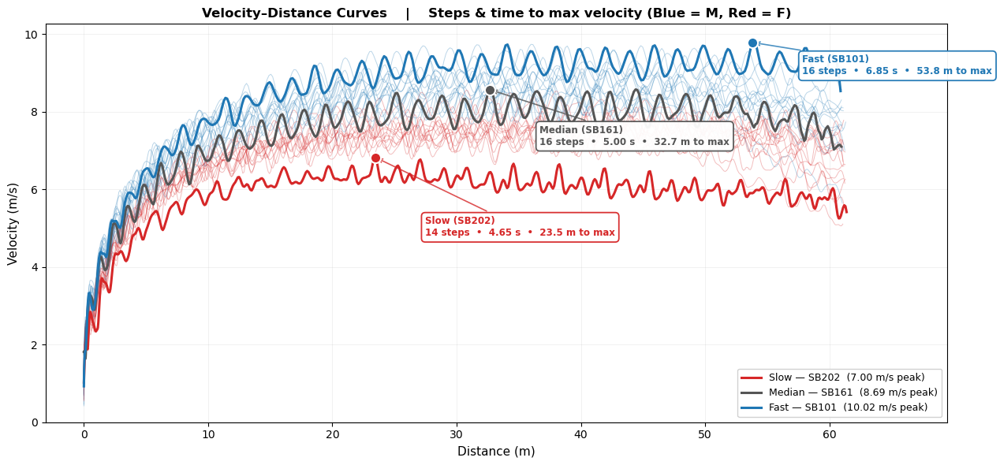

Velocity–distance curve saved with steps-to-max annotations.


In [17]:
# ── Velocity–Distance curves with steps & time to max-velocity ──────────────
# Shows each participant's sprint velocity as a function of distance run.
# Annotations on the three representative sprinters indicate how many steps
# and how long (seconds) it took them to reach max velocity.
from scipy.signal import savgol_filter as _sg


def _steps_to_max(pid, peak_frame):
    """Count step touchdowns occurring at or before peak_frame for this pid."""
    if pid not in accel_raw:
        return None
    return sum(1 for se in accel_raw[pid]['step_events']
               if se.get('Touchdown', 0) <= peak_frame)


fig, ax = plt.subplots(figsize=(13, 6))

# Faint background: every participant
for pid, vt in velocity_traces.items():
    vel  = _sg(np.array(vt['velocity_ms']), 9, 3)
    dist = np.array(vt['distance_m']); dist -= dist[0]
    col  = {'F':'#d62728', 'M':'#1f77b4'}.get(PARTICIPANT_SEX.get(pid, '?'), '#888')
    ax.plot(dist, vel, color=col, lw=0.7, alpha=0.30)

# Bold foreground: three representative sprinters, plus annotation at peak
rep_specs = [
    ('Slow',   pid_slow, '#d62728'),
    ('Median', pid_med,  '#555555'),
    ('Fast',   pid_fast, '#1f77b4'),
]

# Stagger annotations on the right-hand side to avoid crowding
y_anchor_offsets = [-1.8, -1.2, -0.6]   # below each curve peak

for (role, pid, col), y_off in zip(rep_specs, y_anchor_offsets):
    vt   = velocity_traces[pid]
    vel  = _sg(np.array(vt['velocity_ms']), 9, 3)
    dist = np.array(vt['distance_m']); dist -= dist[0]
    pf   = vt['peak_frame']
    pv   = vt['peak_vel']

    ax.plot(dist, vel, color=col, lw=2.2,
            label=f'{role} — {pid}  ({pv:.2f} m/s peak)')
    ax.scatter(dist[pf], vel[pf], s=90, color=col, zorder=5,
               edgecolor='white', linewidth=1.5)

    n_steps     = _steps_to_max(pid, pf)
    t_to_max    = pf / SAMPLING_RATE
    dist_to_max = dist[pf]
    step_str    = f'{n_steps} steps' if n_steps is not None else 'n/a steps'

    annot = (f'{role} ({pid})\n'
             f'{step_str}  •  {t_to_max:.2f} s  •  {dist_to_max:.1f} m to max')

    # Place annotation BELOW the curve, anchored slightly right of peak
    ax.annotate(annot,
        xy=(dist[pf], vel[pf]),
        xytext=(dist[pf] + 4, vel[pf] + y_off),
        fontsize=8.5, color=col, fontweight='bold',
        ha='left', va='center',
        bbox=dict(boxstyle='round,pad=0.4', facecolor='white',
                  edgecolor=col, lw=1.3, alpha=0.95),
        arrowprops=dict(arrowstyle='->', color=col, lw=1.2, alpha=0.8))

ax.set_xlabel('Distance (m)', fontsize=11)
ax.set_ylabel('Velocity (m/s)', fontsize=11)
ax.set_title('Velocity–Distance Curves    |    Steps & time to max velocity '
             '(Blue = M, Red = F)',
             fontsize=12, fontweight='bold')
ax.legend(loc='lower right', fontsize=9, framealpha=0.9)
ax.grid(alpha=0.25, lw=0.5)
ax.set_ylim(bottom=0)

# Add a bit of right-hand margin for annotations
xlim = ax.get_xlim()
ax.set_xlim(xlim[0], xlim[1] + 5)

plt.tight_layout()
fig.savefig(FIG_DIR / 'velocity_distance.png', dpi=150, bbox_inches='tight')
plt.show()
print("Velocity–distance curve saved with steps-to-max annotations.")


---
## Acceleration-Phase fPCA


In [18]:
# ── Acceleration-phase stride extraction ──────────────────────────────────────
# Repeat the full pipeline but keep ONLY strides from the acceleration phase
# (before the sprinter reaches 80% of their peak velocity).
# This gives a separate dataset to ask: "what movement patterns predict fast acceleration?"
N_ACCEL_STRIDES  = 4      # use up to 4 strides from the acceleration phase
ACCEL_THRESHOLD  = 0.80   # acceleration ends when velocity first hits 80% of peak

accel_results = []
accel_failed  = []

for fpath in tqdm(sorted(C3D_DIR.glob("*.c3d")), desc="Accel strides"):
    pid = fpath.stem.split("-")[0].strip()
    if pid not in velocity_traces or pid in EXCLUDED_PIDS:
        continue   # skip if we couldn't process this participant earlier

    try:
        vt       = velocity_traces[pid]
        vel_arr  = np.array(vt['velocity_ms'])
        peak_v   = float(vt['peak_vel'])

        # Find the first frame where velocity reaches 80% of peak
        above_80 = np.where(vel_arr >= ACCEL_THRESHOLD * peak_v)[0]
        if len(above_80) == 0 or above_80[0] < 10:
            raise ValueError("Accel phase too short or never reached 80% peak vel")
        accel_end = int(above_80[0])   # frame number where acceleration ends

        # Run the full preprocessing pipeline again for this file
        mk, raw64, fs = load_c3d(fpath)
        # Align using canonical Chris V. method from (FINAL) Sprint_Ensemble_Viz.ipynb
        mk, raw64 = perform_pca_alignment(mk, raw64)
        start = detect_sprint_start(mk, fs)
        mk    = mk[start:];  raw64 = raw64[start:]
        mk    = shift_origin(mk)
        r_x   = raw64[0, MK_R_HEEL, 0];  l_x = raw64[0, MK_L_HEEL, 0]
        orig  = raw64[0, MK_R_HEEL if r_x <= l_x else MK_L_HEEL].copy()
        raw64 = raw64 - orig
        mk    = trim_sprint(mk)
        raw64 = raw64[:mk.shape[0]]

        # Restrict to the acceleration phase only
        mk_a    = mk[:accel_end]
        raw64_a = raw64[:accel_end]

        vel_a, peak_fa, peak_va = compute_velocity(mk_a, fs)
        strides_a, _            = detect_strides(mk_a, peak_fa, n_strides=N_ACCEL_STRIDES)
        if not strides_a:
            raise ValueError("No accel strides detected")

        stride64_a = [time_normalize_stride(raw64_a[s0:s1+1]) for s0, s1 in strides_a]
        mean_a64   = np.mean(stride64_a, axis=0)
        vec_a, ht_a = create_stride_vector_64(mean_a64)

        accel_results.append(dict(participant_id=pid, vector=vec_a,
                                  max_velocity=float(peak_va),
                                  height=float(ht_a),
                                  n_strides=len(strides_a)))
    except Exception as e:
        accel_failed.append((pid, str(e)))

# Build the acceleration dataset matrix: (N_accel, 19392)
accel_dataset = np.array([r['vector'] for r in accel_results])
accel_meta    = pd.DataFrame([{k: v for k, v in r.items() if k != 'vector'}
                               for r in accel_results])
accel_meta['sex'] = accel_meta['participant_id'].map(PARTICIPANT_SEX).fillna('?')

np.save(DATA_DIR / 'accel_participant_vectors.npy', accel_dataset)
accel_meta.to_csv(DATA_DIR / 'accel_metadata.csv', index=False)

print(f"Accel dataset : {accel_dataset.shape}")
if accel_failed:
    for pid, err in accel_failed: print(f"  FAILED {pid}: {err}")


Accel strides:   0%|          | 0/31 [00:00<?, ?it/s]

Accel dataset : (26, 19392)
  FAILED SB153: No accel strides detected
  FAILED SB23: No accel strides detected
  FAILED SB73: No accel strides detected
  FAILED SB74: No accel strides detected


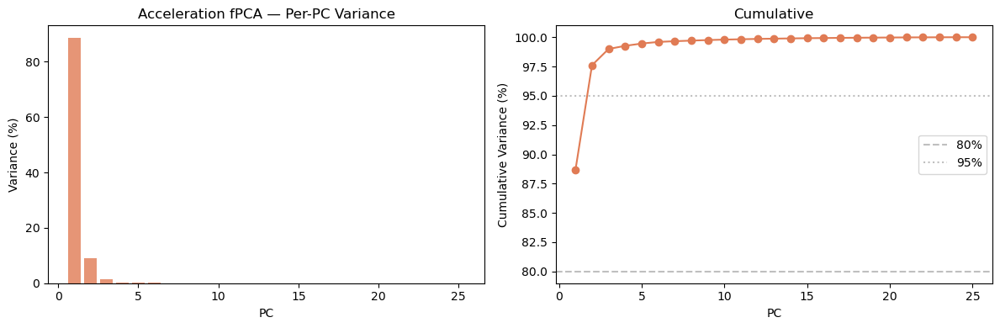

95% variance: 2 PCs  |  top-5: [88.7  9.   1.4  0.3  0.2]


In [19]:
# ── Functional PCA on acceleration strides ────────────────────────────────────
# Exactly the same process as Cell 8, but applied to the acceleration dataset.
# This tells us which movement patterns during the acceleration phase predict
# top speed performance.
accel_mu   = accel_dataset.mean(axis=0)
X_ac       = accel_dataset - accel_mu
y_ac       = accel_meta['max_velocity'].values
N_COMP_AC  = min(30, accel_dataset.shape[0] - 1)

accel_fpca   = PCA(n_components=N_COMP_AC, random_state=RANDOM_SEED)
accel_scores = accel_fpca.fit_transform(X_ac)

# Scree plot for the acceleration PCA
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
x = range(1, N_COMP_AC + 1)
ax1.bar(x, accel_fpca.explained_variance_ratio_ * 100, color='#e07b54', alpha=0.8)
ax1.set(xlabel='PC', ylabel='Variance (%)', title='Acceleration fPCA — Per-PC Variance')
cv = accel_fpca.explained_variance_ratio_.cumsum()
ax2.plot(x, cv * 100, 'o-', color='#e07b54')
for thr, ls in [(80,'--'),(95,':')]:
    ax2.axhline(thr, ls=ls, color='grey', alpha=0.5, label=f'{thr}%')
ax2.set(xlabel='PC', ylabel='Cumulative Variance (%)', title='Cumulative'); ax2.legend()
plt.tight_layout()
fig.savefig(FIG_DIR / 'scree_accel.png', dpi=150, bbox_inches='tight')
plt.show()
n_95_ac = int(np.searchsorted(cv, 0.95) + 1)
print(f"95% variance: {n_95_ac} PCs  |  top-5: {(accel_fpca.explained_variance_ratio_[:5]*100).round(1)}")


---
## MATLAB Handoff

Export stride matrices → MATLAB figures, then import scores back.


In [20]:
# ── Export data for MATLAB ────────────────────────────────────────────────────
# MATLAB cannot read Python variables directly.  We save them to a .mat file
# (MATLAB's native file format) using scipy.io.savemat.
#
# MATLAB script sprint_fPCA_figures.m reads PCA_handoff.mat and generates
# the skeleton figure PNGs.  After it finishes, come back here and run Cell 20.
from scipy.io import savemat

_hdir = SCRIPT_DIR / 'MatLab' / 'Handoff'
_hdir.mkdir(parents=True, exist_ok=True)

def _df_to_struct(df):
    # Convert a pandas DataFrame into a dict that MATLAB can read as a struct.
    # String columns need special handling because Python and MATLAB store
    # text in different internal formats.
    out = {}
    for col in df.columns:
        vals = df[col].values
        if vals.dtype == object:   # string column
            out[col] = np.array([('' if v is None else str(v)) for v in vals], dtype=object)
        else:
            out[col] = vals
    return out

# The const dictionary tells MATLAB which marker index corresponds to which body part.
# MATLAB uses 1-based indices, so we add 1 to all of Python's 0-based indices.
_const = {
    'N_FRAMES'     : TN_POINTS,
    'N_MARKERS'    : N_MARKERS_C3D,
    'SCALE_MM'     : SCALE_MM,
    'MK_PELVIS'    : MK_PELVIS + 1,      # +1: Python 0-based -> MATLAB 1-based
    'MK_T12'       : MK_T12 + 1,
    'MK_R_HEEL'    : MK_R_HEEL + 1,
    'MK_L_HEEL'    : MK_L_HEEL + 1,
    'MK_R_TOE'     : MK_R_TOE + 1,
    'MK_L_TOE'     : MK_L_TOE + 1,
    'MK_HEAD'      : np.array(MK_HEAD) + 1,
    'MK_PELVIS_ALL': np.array(MK_PELVIS_ALL) + 1,
    'MK_R_KNEE'    : np.array(MK_R_KNEE) + 1,
    'MK_L_KNEE'    : np.array(MK_L_KNEE) + 1,
    'MK_R_ANKLE'   : np.array(MK_R_ANKLE) + 1,
    'MK_L_ANKLE'   : np.array(MK_L_ANKLE) + 1,
}

savemat(str(_hdir / 'PCA_handoff.mat'), {
    'dataset'       : dataset.astype(np.float64),
    'accel_dataset' : accel_dataset.astype(np.float64),
    'meta'          : _df_to_struct(meta_df),
    'accel_meta'    : _df_to_struct(accel_meta),
    'const'         : _const,
})
print(f"Saved  MatLab/Handoff/PCA_handoff.mat")
print(f"  dataset      : {dataset.shape}")
print(f"  accel_dataset: {accel_dataset.shape}")
print()
print("Next: run  MatLab/sprint_fPCA_figures.m  in MATLAB, then continue below.")


Saved  MatLab/Handoff/PCA_handoff.mat
  dataset      : (30, 19392)
  accel_dataset: (26, 19392)

Next: run  MatLab/sprint_fPCA_figures.m  in MATLAB, then continue below.


In [21]:
# ── Import PCA scores produced by MATLAB ─────────────────────────────────────
# After sprint_fPCA_figures.m finishes, it writes PCA_scores.mat containing
# the PCA scores re-computed in MATLAB.  We load them here so the rest of
# this notebook uses the MATLAB-verified scores.
#
# If the file does not exist yet, we just keep the Python-computed scores and continue.
from scipy.io import loadmat

_path = SCRIPT_DIR / 'MatLab' / 'Handoff' / 'PCA_scores.mat'

if _path.exists():
    S = loadmat(str(_path))
    # Replace Python scores with MATLAB scores (they should be nearly identical)
    scores       = np.asarray(S['ts_scores'])     # top-speed PCA scores
    accel_scores = np.asarray(S['ac_scores'])     # acceleration PCA scores

    # The rest of the notebook calls fpca.explained_variance_ratio_, so we wrap
    # the loaded values in a tiny helper class that has that attribute.
    class _Shim:
        def __init__(self, evr): self.explained_variance_ratio_ = evr
    fpca       = _Shim(np.asarray(S['ts_explained']).ravel() / 100.0)
    accel_fpca = _Shim(np.asarray(S['ac_explained']).ravel() / 100.0)

    print(f"Loaded MATLAB scores  ({_path.name})")
    print(f"  ts_scores   : {scores.shape}   top-5 var = "
          f"{(fpca.explained_variance_ratio_[:5]*100).round(1)}")
    print(f"  accel_scores: {accel_scores.shape}   top-5 var = "
          f"{(accel_fpca.explained_variance_ratio_[:5]*100).round(1)}")
else:
    print(f"[skip] {_path} not found — run MATLAB first.")
    print("       Continuing with Python-fit scores.")


[skip] /Users/shunchen/Desktop/60m Project Folder/Shun's Sprints Code/MatLab/Handoff/PCA_scores.mat not found — run MATLAB first.
       Continuing with Python-fit scores.


In [22]:
# ── Sanity check: Python vs MATLAB PCA scores ────────────────────────────────
# PCA can arbitrarily flip the sign of a component (+PC and -PC are both valid).
# We verify that Python and MATLAB give the same result for the top 5 PCs
# by computing the Pearson correlation |r|.  We expect |r| > 0.99.
from scipy.io import loadmat as _lm
from sklearn.decomposition import PCA as _PCA

_path = SCRIPT_DIR / 'MatLab' / 'Handoff' / 'PCA_scores.mat'
if not _path.exists():
    print("[skip] PCA_scores.mat not found")
else:
    M = _lm(str(_path))
    _ts_ml = np.asarray(M['ts_scores'])      # MATLAB top-speed scores
    _ac_ml = np.asarray(M['ac_scores'])      # MATLAB acceleration scores
    _ts_ev = np.asarray(M['ts_explained']).ravel()
    _ac_ev = np.asarray(M['ac_explained']).ravel()

    # Refit PCA in Python with 10 components for comparison
    _ts_py = _PCA(n_components=10, random_state=RANDOM_SEED).fit_transform(dataset - dataset.mean(0))
    _ac_py = _PCA(n_components=10, random_state=RANDOM_SEED).fit_transform(accel_dataset - accel_dataset.mean(0))

    def _cmp(label, py, ml, ev_ml):
        # Print a table comparing Python vs MATLAB scores for each PC.
        # |r| close to 1.0 = perfect agreement; sign +/- = possible flip (OK).
        print(f"\n{label}")
        print(f"  {'PC':<4} {'|r|':<8} {'sign':<6} {'var_ml%':<9}")
        rs = []
        for k in range(min(5, ml.shape[1])):
            r = np.corrcoef(py[:,k], ml[:,k])[0,1]   # Pearson r
            rs.append(abs(r))
            print(f"  PC{k+1:<2} {abs(r):<8.4f} {'+' if r>0 else '-':<6} {ev_ml[k]:<9.2f}")
        return rs

    rs_ts = _cmp("Top-speed",    _ts_py, _ts_ml, _ts_ev)
    rs_ac = _cmp("Acceleration", _ac_py, _ac_ml, _ac_ev)

    if all(r > 0.99 for r in rs_ts + rs_ac):
        print("\nPython and MATLAB PCA agree (|r| > 0.99 for top-5 PCs).")
    else:
        print("\nSome PCs differ — check sign flips or normalisation mismatch.")


[skip] PCA_scores.mat not found
